In [1]:
!pip install noise

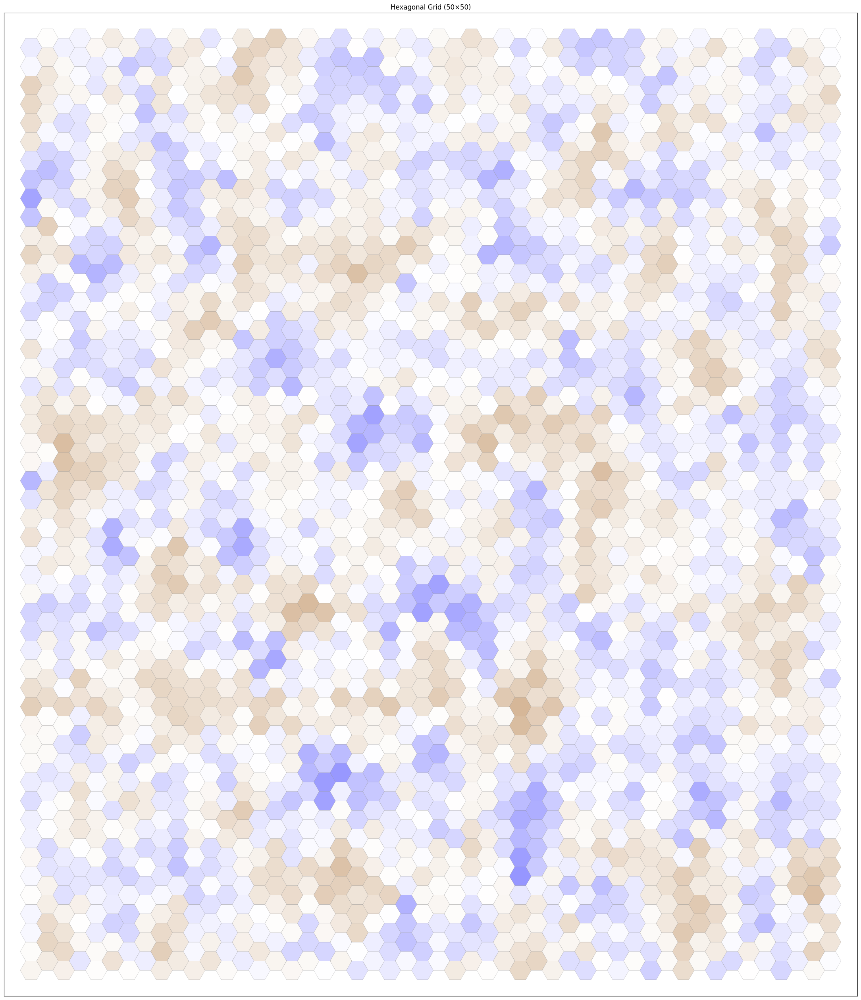

[[-0.075  0.012 -0.049 ...  0.03   0.064 -0.004]
 [-0.025  0.09   0.035 ...  0.179  0.123 -0.009]
 [ 0.246  0.134  0.06  ... -0.043  0.08   0.075]
 ...
 [-0.026  0.199  0.152 ... -0.057  0.024  0.183]
 [ 0.016  0.227  0.205 ... -0.031  0.249  0.148]
 [ 0.061  0.117  0.083 ... -0.064  0.036 -0.012]]


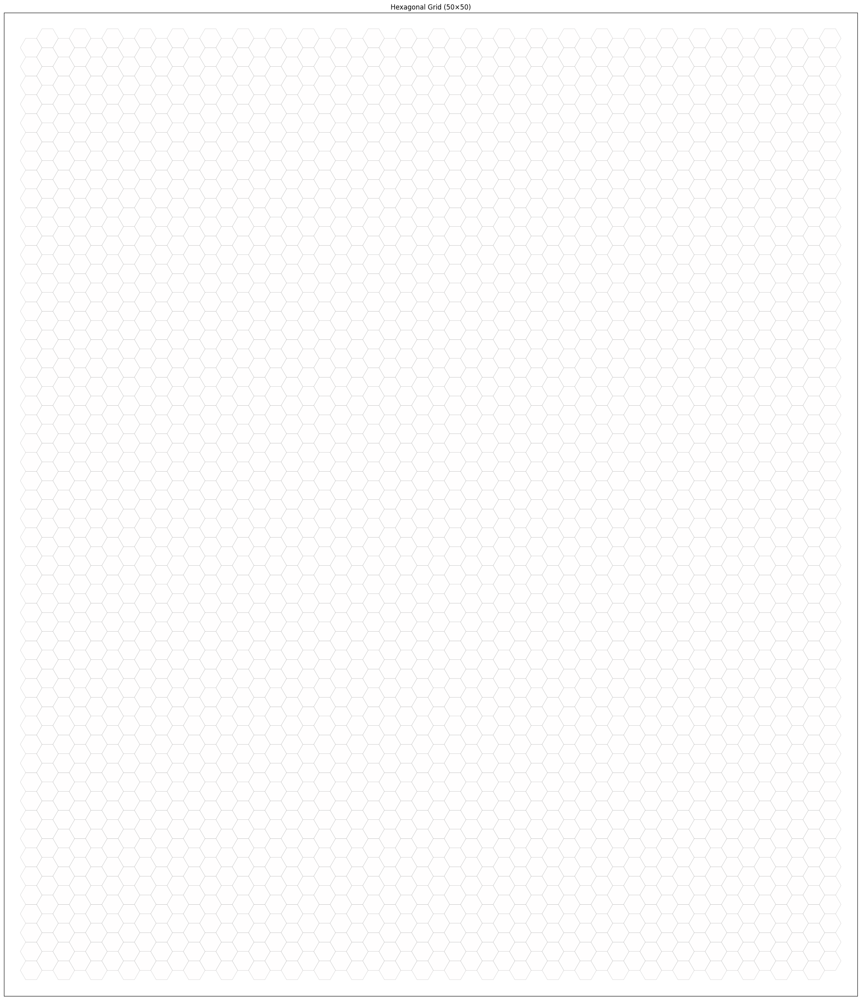

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import noise
import math
from matplotlib.colors import LinearSegmentedColormap
import time

colors = [(0, 0, 1), (1, 1, 1), (0.6, 0.3, 0)]
positions = [0, 0.5, 1]
custom_cmap = LinearSegmentedColormap.from_list("BlueBrown", list(zip(positions, colors)))

def rotate_2d(x, y, deg):
    rad = math.radians(deg)
    cos_ = math.cos(rad)
    sin_ = math.sin(rad)
    x_new = x * cos_ - y * sin_
    y_new = x * sin_ + y * cos_
    return x_new, y_new

def generate_hex_grid(rows, cols, scale=10.0, seed=None, side=1.0):
    if seed is not None:
        np.random.seed(seed)

    offset_x = np.random.uniform(-1000, 1000)
    offset_y = np.random.uniform(-1000, 1000)

    hex_grid = np.zeros((rows, cols))

    for r in range(rows - 1, -1, -1):
        for c in range(cols):
            x_center = 1.5 * side * c
            y_center = math.sqrt(3) * side * (r + 0.5 * (c % 2))

            val = noise.pnoise2((x_center + offset_x) / scale,
                                (y_center + offset_y) / scale,
                                octaves=4,
                                persistence=0.8,
                                lacunarity=1.5)

            hex_grid[r, c] = val

    hex_grid = np.round(hex_grid, 3)

    return hex_grid

def plot_hex_grid(grid, side=1.0, rotate_deg=15, figsize=None):
    rows, cols = grid.shape
    grid_size = rows * cols
    
    # Dynamic figure size based on grid dimensions
    if figsize is None:
        base_size = 8
        # Increase figure size for larger grids, but not linearly
        figsize = (base_size * math.sqrt(cols/5), base_size * math.sqrt(rows/5))
    
    # Dynamic scaling based on grid size
    if grid_size > 500:
        # For very large grids
        scaling_factor = min(1.0, math.sqrt(500 / grid_size))
        side *= scaling_factor
        show_coords = False
        show_values = False
        font_size = 0  # No text
        edge_width = 0.2
    elif grid_size > 200:
        # For large grids
        scaling_factor = min(1.0, math.sqrt(200 / grid_size))
        side *= scaling_factor
        show_coords = False
        show_values = True
        font_size = side * 1.5
        edge_width = 0.3
    elif grid_size > 50:
        # For medium grids
        scaling_factor = min(1.0, math.sqrt(50 / grid_size))
        side *= scaling_factor
        show_coords = True
        show_values = True
        font_size = side * 2.5
        edge_width = 0.5
    else:
        # For small grids
        show_coords = True
        show_values = True
        font_size = side * 4
        edge_width = 0.7
    
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_aspect('equal')
    ax.set_xticks([])
    ax.set_yticks([])
    
    # Define the hexagon corners
    base_corners = [
        (0, 1),
        (math.sqrt(3) / 2, 0.5),
        (math.sqrt(3) / 2, -0.5),
        (0, -1),
        (-math.sqrt(3) / 2, -0.5),
        (-math.sqrt(3) / 2, 0.5),
    ]
    
    scaled_corners = [(x * side, y * side) for (x, y) in base_corners]
    rotated_corners = [rotate_2d(x, y, rotate_deg) for (x, y) in scaled_corners]
    
    min_x, max_x = float('inf'), float('-inf')
    min_y, max_y = float('inf'), float('-inf')
    
    # Draw each hexagon
    for r in range(rows - 1, -1, -1):
        for c in range(cols):
            x_center = 1.5 * side * c
            y_center = math.sqrt(3) * side * ((rows - r - 1) + 0.5 * (c % 2))
            val = grid[r, c]
            color = custom_cmap((val + 1) / 2)
            
            verts = [(x_center + dx, y_center + dy) for (dx, dy) in rotated_corners]
            
            # Correct min/max calculation - ensure we're using x,y coordinates properly
            for vx, vy in verts:
                min_x = min(min_x, vx)
                max_x = max(max_x, vx)
                min_y = min(min_y, vy)
                max_y = max(max_y, vy)
            
            # Create and add the hexagon
            poly = plt.Polygon(verts,
                              facecolor=color,
                              edgecolor='gray',
                              linewidth=edge_width)
            ax.add_patch(poly)
            
            # Add text for coordinates and terrain value if grid is small enough
            if show_coords and show_values and font_size > 0:
                coord_text = f"({r},{c})\n{val:.2f}"
                ax.text(x_center, y_center, coord_text,
                       ha='center', va='center', size=font_size)
            elif show_coords and font_size > 0:
                coord_text = f"({r},{c})"
                ax.text(x_center, y_center, coord_text,
                       ha='center', va='center', size=font_size)
            elif show_values and font_size > 0:
                val_text = f"{val:.2f}"
                ax.text(x_center, y_center, val_text,
                       ha='center', va='center', size=font_size)
    
    # Add padding to ensure all hexagons are visible
    padding = side * 1.5
    ax.set_xlim(min_x - padding, max_x + padding)
    ax.set_ylim(min_y - padding, max_y + padding)
    
    plt.title(f"Hexagonal Grid ({rows}×{cols})")
    plt.tight_layout()
    plt.show()

def generate_flat_hex_grid(rows, cols):
    """
    Generate a flat hexagonal grid with zero elevation.
    
    Parameters:
        rows (int): Number of rows in the grid
        cols (int): Number of columns in the grid
        
    Returns:
        numpy.ndarray: Grid with all values set to 0.0
    """
    # Create a grid filled with zeros (flat terrain)
    flat_grid = np.zeros((rows, cols))
    
    # Round to 3 decimal places for consistency with the original function
    flat_grid = np.round(flat_grid, 3)
    
    return flat_grid

if __name__ == '__main__':
    rows, cols = (50,50)
    side_length = 1.0
    terrain_scale = 8.0

    hex_data = generate_hex_grid(rows,
                                 cols,
                                 scale=terrain_scale,
                                 side=side_length)

    plot_hex_grid(hex_data,
                  side=side_length,
                  rotate_deg=30)

    print(hex_data)

    hex_data = generate_flat_hex_grid(rows, cols)
    
    # Use the improved plot_hex_grid function
    plot_hex_grid(hex_data,
                  side=side_length,
                  rotate_deg=30)
    
    print(hex_data)

    



In [3]:
def get_hex_neighbors(rows, cols, r, c):
    # Define relative positions for even and odd columns
    if c % 2 == 1:  # odd column
        neighbors = [
            (-1, 0),  # Top
            (-1, 1),  # Top-right
            (0, 1),   # Right
            (1, 0),   # Bottom
            (0, -1),  # Left
            (-1, -1)  # Top-left
        ]
    else:  # even column
        neighbors = [
            (0, 1),   # Right
            (1, 1),   # Bottom-right
            (1, 0),   # Bottom
            (1, -1),  # Bottom-left
            (0, -1),  # Left
            (-1, 0)   # Top-left
        ]

    valid_neighbors = []

    for dr, dc in neighbors:
        nr, nc = r + dr, c + dc

        # Check if the neighbor is within the bounds of the grid
        if 0 <= nr < rows and 0 <= nc < cols:
            valid_neighbors.append((nr, nc))

    return valid_neighbors

def heuristic(cell, goal):
        # Manhattan distance for hex grid
        r1, c1 = cell
        r2, c2 = goal
        return abs(r1 - r2) + abs(c1 - c2)


In [4]:
def calculate_movement_cost(grid, current, neighbor, uphill_penalty=0.7, downhill_bonus=0.3):
    """
    Calculate movement cost between hexes based on terrain elevation.

    Parameters:
        grid: The terrain grid with elevation values
        current: (row, col) of current hex
        neighbor: (row, col) of neighbor hex
        uphill_penalty: Multiplier for uphill movement (higher = more penalty)
        downhill_bonus: Multiplier for downhill movement (higher = more bonus)

    Returns:
        float: Movement cost from current to neighbor
    """
    # Base movement cost
    base_cost = 1.0

    # Calculate elevation difference
    current_elevation = grid[current[0]][current[1]]
    neighbor_elevation = grid[neighbor[0]][neighbor[1]]
    elevation_diff = neighbor_elevation - current_elevation

    # Normalize the elevation difference
    max_possible_diff = 2.0  # Since our terrain values range from -1 to 1
    normalized_diff = abs(elevation_diff) / max_possible_diff

    if elevation_diff > 0:
        # Going uphill - apply penalty
        return base_cost * (1 + uphill_penalty * normalized_diff)
    elif elevation_diff < 0:
        # Going downhill - apply bonus
        return base_cost * (1 - downhill_bonus * normalized_diff)
    else:
        # Flat terrain
        return base_cost

def heuristic(a, b):
    """
    Hexagonal grid distance heuristic.

    Parameters:
        a: (row, col) of first hex
        b: (row, col) of second hex

    Returns:
        float: Estimated distance between hexes
    """
    # Manhattan distance on hex grid
    dx = abs(a[1] - b[1])
    dy = abs(a[0] - b[0])

    # Adjust for hex grid geometry
    if (a[1] % 2 == 0 and b[1] % 2 == 1):
        # Even to odd column
        if a[0] < b[0]:
            dy = abs(a[0] - (b[0] - 0.5))
    elif (a[1] % 2 == 1 and b[1] % 2 == 0):
        # Odd to even column
        if b[0] < a[0]:
            dy = abs((a[0] - 0.5) - b[0])

    return dx + dy



In [5]:
import heapq
import time
import math

def heuristic(cell, goal):
    # Simple Manhattan heuristic for hex grid (adjust if needed)
    r1, c1 = cell
    r2, c2 = goal
    return abs(r1 - r2) + abs(c1 - c2)

def calculate_movement_cost(grid, current, neighbor, uphill_penalty=0.7, downhill_bonus=0.3):
    """
    Calculate movement cost between hexes based on terrain elevation.
    """
    base_cost = 1.0
    current_elevation = grid[current[0]][current[1]]
    neighbor_elevation = grid[neighbor[0]][neighbor[1]]
    elevation_diff = neighbor_elevation - current_elevation
    max_possible_diff = 2.0  # Maximum difference from -1 to 1
    normalized_diff = abs(elevation_diff) / max_possible_diff
    if elevation_diff > 0:
        return base_cost * (1 + uphill_penalty * normalized_diff)
    elif elevation_diff < 0:
        return base_cost * (1 - downhill_bonus * normalized_diff)
    else:
        return base_cost

def get_hex_neighbors(rows, cols, r, c):
    # Define neighbors for even and odd columns
    if c % 2 == 1:  # odd column
        neighbors = [
            (-1, 0),  # Top
            (-1, 1),  # Top-right
            (0, 1),   # Right
            (1, 0),   # Bottom
            (0, -1),  # Left
            (-1, -1)  # Top-left
        ]
    else:  # even column
        neighbors = [
            (0, 1),   # Right
            (1, 1),   # Bottom-right
            (1, 0),   # Bottom
            (1, -1),  # Bottom-left
            (0, -1),  # Left
            (-1, 0)   # Top-left
        ]
    valid_neighbors = []
    for dr, dc in neighbors:
        nr, nc = r + dr, c + dc
        if 0 <= nr < rows and 0 <= nc < cols:
            valid_neighbors.append((nr, nc))
    return valid_neighbors

def a_star_search(grid, start, goal, uphill_penalty=0.7, downhill_bonus=0.3):
    """
    A* pathfinding with terrain costs on a hexagonal grid.

    Parameters:
        grid: Terrain grid with elevation values
        start: (row, col) starting position
        goal: (row, col) destination
        uphill_penalty: Cost multiplier for uphill movement
        downhill_bonus: Cost reduction for downhill movement

    Returns:
        tuple: (path, path_cost, comp_time, nodes_expanded)
               - path: Optimal path from start to goal (as a list of (row, col) tuples)
               - path_cost: Sum of movement costs along the path
               - comp_time: Computation time in seconds
               - nodes_expanded: Total number of nodes expanded during search
    """
    rows, cols = len(grid), len(grid[0])
    g_score = {start: 0}
    f_score = {start: heuristic(start, goal)}

    open_set = []
    heapq.heappush(open_set, (f_score[start], start))
    came_from = {}
    closed_set = set()

    # Start time for computation time metric.
    start_time = time.time()

    nodes_expanded = 0

    while open_set:
        _, current = heapq.heappop(open_set)

        # Skip if already processed.
        if current in closed_set:
            continue

        closed_set.add(current)
        nodes_expanded += 1  # count the expansion of current node

        if current == goal:
            # Reconstruct path
            path = []
            while current in came_from:
                path.append(current)
                current = came_from[current]
            path.append(start)
            path = path[::-1]
            total_cost = g_score[goal]
            comp_time = time.time() - start_time
            return path, total_cost, comp_time, nodes_expanded

        r, c = current
        for neighbor in get_hex_neighbors(rows, cols, r, c):
            if neighbor in closed_set:
                continue

            movement_cost = calculate_movement_cost(grid, current, neighbor, uphill_penalty, downhill_bonus)
            tentative_g = g_score[current] + movement_cost

            if neighbor not in g_score or tentative_g < g_score[neighbor]:
                came_from[neighbor] = current
                g_score[neighbor] = tentative_g
                f_score[neighbor] = tentative_g + heuristic(neighbor, goal)
                heapq.heappush(open_set, (f_score[neighbor], neighbor))

    comp_time = time.time() - start_time
    # If no path is found, return empty list and metrics
    return [], None, comp_time, nodes_expanded

In [6]:
import heapq
import time
import math

def heuristic(cell, goal):
    # Simple Manhattan heuristic for hex grid; adjust as needed.
    r1, c1 = cell
    r2, c2 = goal
    return abs(r1 - r2) + abs(c1 - c2)

def calculate_movement_cost(grid, current, neighbor, uphill_penalty=0.7, downhill_bonus=0.3):
    """
    Calculate movement cost between hexes based on terrain elevation.
    """
    base_cost = 1.0
    current_elevation = grid[current[0]][current[1]]
    neighbor_elevation = grid[neighbor[0]][neighbor[1]]
    elevation_diff = neighbor_elevation - current_elevation
    max_possible_diff = 2.0  # (Terrain values assumed from -1 to 1)
    normalized_diff = abs(elevation_diff) / max_possible_diff
    if elevation_diff > 0:
        return base_cost * (1 + uphill_penalty * normalized_diff)
    elif elevation_diff < 0:
        return base_cost * (1 - downhill_bonus * normalized_diff)
    else:
        return base_cost

def get_hex_neighbors(rows, cols, r, c):
    # Define relative positions for even and odd columns.
    if c % 2 == 1:  # odd column
        neighbors = [
            (-1, 0),  # Top
            (-1, 1),  # Top-right
            (0, 1),   # Right
            (1, 0),   # Bottom
            (0, -1),  # Left
            (-1, -1)  # Top-left
        ]
    else:  # even column
        neighbors = [
            (0, 1),   # Right
            (1, 1),   # Bottom-right
            (1, 0),   # Bottom
            (1, -1),  # Bottom-left
            (0, -1),  # Left
            (-1, 0)   # Top-left
        ]
    valid_neighbors = []
    for dr, dc in neighbors:
        nr, nc = r + dr, c + dc
        if 0 <= nr < rows and 0 <= nc < cols:
            valid_neighbors.append((nr, nc))
    return valid_neighbors

def greedy_best_first_search(grid, start, goal, uphill_penalty=0.7, downhill_bonus=0.3):
    """
    Greedy Best-First Search with terrain considerations and evaluation metrics.

    Parameters:
        grid: Terrain grid with elevation values.
        start: (row, col) starting position.
        goal: (row, col) destination.
        uphill_penalty: Cost multiplier for uphill movement.
        downhill_bonus: Cost reduction for downhill movement.

    Returns:
        tuple: (path, path_cost, comp_time, nodes_expanded)
               - path: List of (row, col) positions from start to goal.
               - path_cost: Sum of movement costs along the path.
               - comp_time: Computation time in seconds.
               - nodes_expanded: Total number of nodes expanded.
    """
    rows, cols = len(grid), len(grid[0])
    open_set = []

    # For Greedy BFS we use only the heuristic for prioritization.
    # Adding a second element as a tiebreaker (counter).
    heapq.heappush(open_set, (heuristic(start, goal), 0, start))
    came_from = {}
    visited = set()
    counter = 1  # Tiebreaker for equal heuristic values.
    nodes_expanded = 0

    start_time = time.time()

    while open_set:
        _, _, current = heapq.heappop(open_set)
        if current in visited:
            continue
        visited.add(current)
        nodes_expanded += 1

        if current == goal:
            # Reconstruct path.
            path = []
            while current in came_from:
                path.append(current)
                current = came_from[current]
            path.append(start)
            path = path[::-1]
            # Compute total path cost by summing terrain cost along the path.
            total_cost = 0.0
            for i in range(len(path) - 1):
                total_cost += calculate_movement_cost(grid, path[i], path[i+1], uphill_penalty, downhill_bonus)
            comp_time = time.time() - start_time
            return path, total_cost, comp_time, nodes_expanded

        r, c = current
        neighbors = get_hex_neighbors(rows, cols, r, c)
        terrain_costs = []
        for neighbor in neighbors:
            if neighbor not in visited:
                # Calculate movement cost from current to neighbor.
                movement_cost = calculate_movement_cost(grid, current, neighbor, uphill_penalty, downhill_bonus)
                # Combine heuristic (goal direction) with a scaled terrain cost.
                combined_cost = heuristic(neighbor, goal) + (movement_cost - 1.0) * 0.1
                terrain_costs.append((combined_cost, counter, neighbor))
                counter += 1

        for cost, count, neighbor in terrain_costs:
            heapq.heappush(open_set, (cost, count, neighbor))
            if neighbor not in came_from:
                came_from[neighbor] = current

    comp_time = time.time() - start_time
    # Return an empty path along with computed metrics if no path is found.
    return [], None, comp_time, nodes_expanded


In [7]:
def plot_hex_grid_with_path(grid, path, side=1.0, rotate_deg=30, figsize=(12, 12)):
    """
    Plot a hexagonal grid with a highlighted path, with automatic scaling for large grids.

    Parameters:
        grid (numpy array): Terrain grid with values.
        path (list): List of (row, col) tuples representing the path from pathfinding.
        side (float): Base length of hexagon side.
        rotate_deg (float): Rotation angle in degrees.
        figsize (tuple): Figure size.
    """
    rows, cols = grid.shape
    grid_size = rows * cols

    # Scale adjustments based on grid size
    if grid_size > 200:
        # For very large grids, scale down significantly
        scaling_factor = min(1.0, 200 / grid_size)
        side *= scaling_factor
        show_coords = False
        show_values = False
        show_step_numbers = False
        edge_width_regular = 0.2
        edge_width_path = 0.8
        edge_width_endpoint = 1.5
        path_line_width = 1.0
        font_size_coords = 0  # No text
        font_size_labels = 0  # No labels
    elif grid_size > 100:
        # For large grids
        scaling_factor = min(1.0, 100 / grid_size)
        side *= scaling_factor
        show_coords = False
        show_values = False
        show_step_numbers = False
        edge_width_regular = 0.3
        edge_width_path = 1.0
        edge_width_endpoint = 2.0
        path_line_width = 1.2
        font_size_coords = 0  # No text
        font_size_labels = 7
    elif grid_size > 50:
        # For medium grids
        show_coords = False
        show_values = True
        show_step_numbers = True
        edge_width_regular = 0.5
        edge_width_path = 1.5
        edge_width_endpoint = 2.5
        path_line_width = 1.5
        font_size_coords = 6
        font_size_labels = 8
    else:
        # For small grids, show everything
        show_coords = True
        show_values = True
        show_step_numbers = True
        edge_width_regular = 0.7
        edge_width_path = 2.0
        edge_width_endpoint = 3.0
        path_line_width = 2.0
        font_size_coords = 8
        font_size_labels = 9

    # Increase figure size for larger grids to maintain clarity
    if grid_size > 100:
        figsize = (14, 14)

    # Setup figure
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_aspect('equal')
    ax.set_xticks([])
    ax.set_yticks([])

    if not path:
        print("No path provided. Displaying normal grid.")
        path = []
        start = None
        end = None
    else:
        start = path[0]
        end = path[-1]

    # Define the hexagon corners
    base_corners = [
        (0, 1),
        (math.sqrt(3) / 2, 0.5),
        (math.sqrt(3) / 2, -0.5),
        (0, -1),
        (-math.sqrt(3) / 2, -0.5),
        (-math.sqrt(3) / 2, 0.5),
    ]

    scaled_corners = [(x * side, y * side) for (x, y) in base_corners]
    rotated_corners = [rotate_2d(x, y, rotate_deg) for (x, y) in scaled_corners]

    min_x, max_x = float('inf'), float('-inf')
    min_y, max_y = float('inf'), float('-inf')

    # Store cell centers for path line drawing
    centers = {}

    # Draw each hexagon
    for r in range(rows - 1, -1, -1):
        for c in range(cols):
            x_center = 1.5 * side * c
            y_center = math.sqrt(3) * side * ((rows - r - 1) + 0.5 * (c % 2))
            centers[(r, c)] = (x_center, y_center)

            verts = [(x_center + dx, y_center + dy) for (dx, dy) in rotated_corners]

            # Correct min/max calculation - ensure we're using x,y coordinates properly
            for vx, vy in verts:
                min_x = min(min_x, vx)
                max_x = max(max_x, vx)
                min_y = min(min_y, vy)
                max_y = max(max_y, vy)

            # Determine cell type and styling
            val = grid[r, c]
            color = custom_cmap((val + 1) / 2)

            is_in_path = (r, c) in path
            is_start = (r, c) == start
            is_end = (r, c) == end

            # Set edge styling based on cell type
            if is_start:
                edge_color = 'green'
                edge_width = edge_width_endpoint
            elif is_end:
                edge_color = 'blue'
                edge_width = edge_width_endpoint
            elif is_in_path:
                edge_color = 'red'
                edge_width = edge_width_path
            else:
                edge_color = 'gray'
                edge_width = edge_width_regular

            # Create and add the hexagon
            poly = plt.Polygon(verts,
                              facecolor=color,
                              edgecolor=edge_color,
                              linewidth=edge_width)
            ax.add_patch(poly)

            # Add text for coordinates and terrain value if grid is small enough
            if show_coords and show_values:
                coord_text = f"({r},{c})\n{val:.2f}"
                ax.text(x_center, y_center, coord_text,
                       ha='center', va='center', size=font_size_coords)
            elif show_coords:
                coord_text = f"({r},{c})"
                ax.text(x_center, y_center, coord_text,
                       ha='center', va='center', size=font_size_coords)
            elif show_values:
                val_text = f"{val:.2f}"
                ax.text(x_center, y_center, val_text,
                       ha='center', va='center', size=font_size_coords)

            # Add path step number if in path and grid is small enough
            if is_in_path and show_step_numbers:
                step_num = path.index((r, c))
                ax.text(x_center, y_center - 0.3 * side,
                       f"Step {step_num}",
                       ha='center', va='center',
                       color='red', weight='bold', size=font_size_coords)

            # Add special markers for start and end with reduced text
            if is_start and font_size_labels > 0:
                ax.text(x_center, y_center + 0.4 * side, "START",
                       ha='center', va='center', color='green',
                       weight='bold', size=font_size_labels)
            elif is_end and font_size_labels > 0:
                ax.text(x_center, y_center + 0.4 * side, "END",
                       ha='center', va='center', color='blue',
                       weight='bold', size=font_size_labels)

    # Draw connecting lines along the path, but with reduced complexity for large grids
    if len(path) > 1:
        # For very large grids, simplify the path by sampling fewer points
        if grid_size > 500 and len(path) > 50:
            step = max(1, len(path) // 50)
            sampled_path = [path[i] for i in range(0, len(path), step)]
            if path[-1] not in sampled_path:
                sampled_path.append(path[-1])

            path_x = [centers[cell][0] for cell in sampled_path]
            path_y = [centers[cell][1] for cell in sampled_path]
        else:
            path_x = [centers[cell][0] for cell in path]
            path_y = [centers[cell][1] for cell in path]

        ax.plot(path_x, path_y, 'r-', linewidth=path_line_width, alpha=0.7)

    # Add a legend to explain the colors
    from matplotlib.patches import Patch
    from matplotlib.lines import Line2D

    legend_elements = [
        Patch(facecolor='none', edgecolor='green', linewidth=edge_width_endpoint, label='Start'),
        Patch(facecolor='none', edgecolor='blue', linewidth=edge_width_endpoint, label='End'),
        Patch(facecolor='none', edgecolor='red', linewidth=edge_width_path, label='Path'),
        Line2D([0], [0], color='red', lw=path_line_width, label='Path Direction')
    ]

    ax.legend(handles=legend_elements, loc='upper right')

    # Add padding to ensure all hexagons are visible
    padding = side * 1.5
    ax.set_xlim(min_x - padding, max_x + padding)
    ax.set_ylim(min_y - padding, max_y + padding)

    # Add information about the path length and grid size
    plt.title(f"Hexagonal Grid Path ({len(path)} steps on {rows}×{cols} grid)")
    plt.tight_layout()
    plt.show()


In [14]:
# Generate terrain
rows, cols = 100, 100
hex_data = generate_hex_grid(rows, cols, scale=8.0)

# Define start and goal positions
start = (0, 0)  # Top-left
goal = (90, 80)  # Bottom-right


Total Greedy Path Cost: 131.778
Greedy Computation Time: 0.001 seconds
Greedy Nodes Expanded: 131


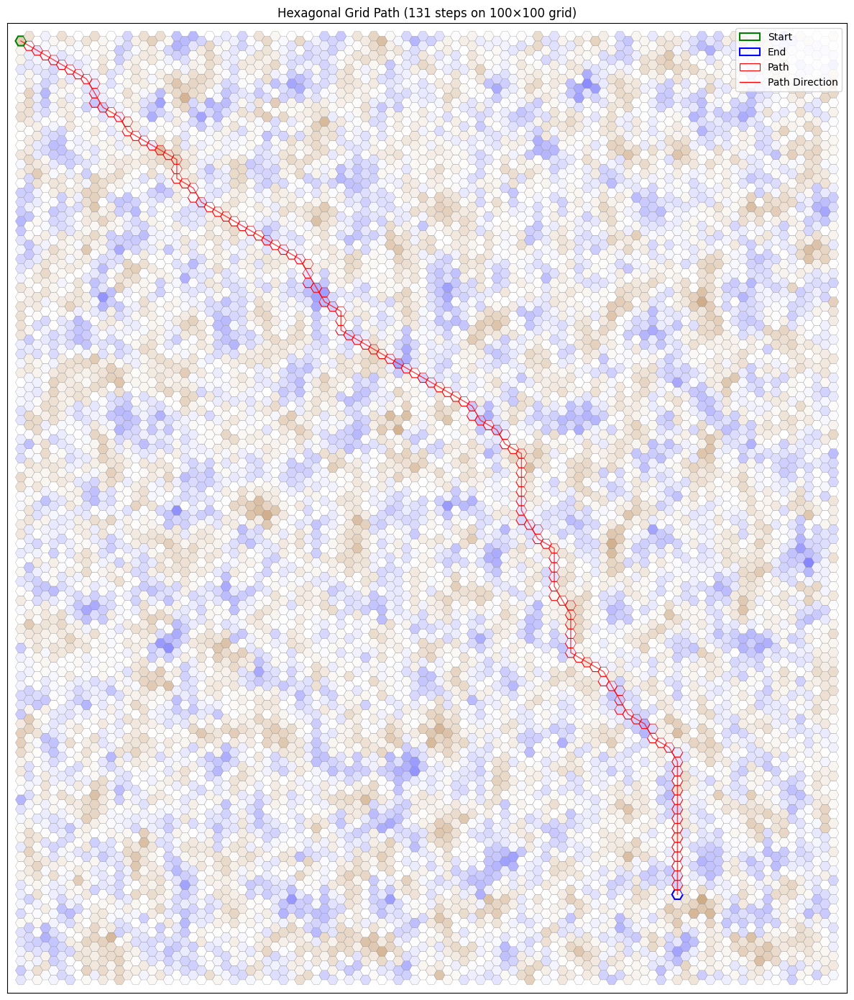

In [9]:
# Alternatively, run Greedy Best-First Search
greedy_path, greedy_path_cost, greedy_comp_time, greedy_nodes_expanded = greedy_best_first_search(
    hex_data, start, goal,
    uphill_penalty=0.8,
    downhill_bonus=0.2
)

print(f"Total Greedy Path Cost: {greedy_path_cost:.3f}")
print(f"Greedy Computation Time: {greedy_comp_time:.3f} seconds")
print(f"Greedy Nodes Expanded: {greedy_nodes_expanded}")
plot_hex_grid_with_path(hex_data, greedy_path)



Total A* Path Cost: 131.836
A* Computation Time: 0.002 seconds
A* Nodes Expanded: 159


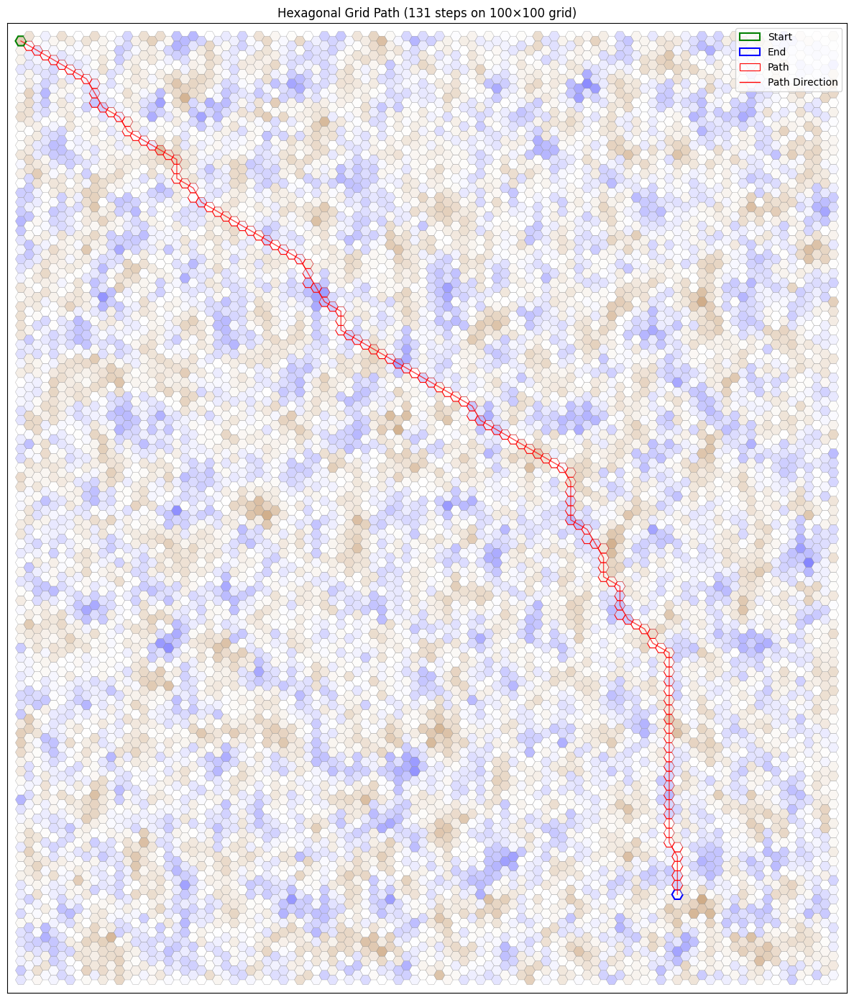

In [10]:
# Run A* with terrain costs
a_star_path,a_star_path_cost, a_star_comp_time, a_star_nodes_expanded = a_star_search(
    hex_data, start, goal,
    uphill_penalty=0.8,  # Steeper penalty for climbing
    downhill_bonus=0.2   # Moderate bonus for going downhill
)

print(f"Total A* Path Cost: {a_star_path_cost:.3f}")
print(f"A* Computation Time: {a_star_comp_time:.3f} seconds")
print(f"A* Nodes Expanded: {a_star_nodes_expanded}")
# Visualize the results (with the improved visualization function)
plot_hex_grid_with_path(hex_data, a_star_path)

In [11]:
# Helper functions for RRT:
# We want the “center” coordinates for each hex cell to compute Euclidean distances.
def get_center(cell, side, rows):
    r, c = cell
    # Use the same center formula as in your plot_hex_grid (adjusting for rows)
    x_center = 1.5 * side * c
    y_center = math.sqrt(3) * side * ((rows - r - 1) + 0.5 * (c % 2))
    return (x_center, y_center)

def distance_cells(cell1, cell2, side, rows):
    x1, y1 = get_center(cell1, side, rows)
    x2, y2 = get_center(cell2, side, rows)
    return math.sqrt((x1 - x2)**2 + (y1 - y2)**2)

# Calculate movement cost between two hex cells based on terrain elevation.
def calculate_movement_cost(grid, current, neighbor, uphill_penalty=0.7, downhill_bonus=0.3):
    base_cost = 1.0
    current_elevation = grid[current[0]][current[1]]
    neighbor_elevation = grid[neighbor[0]][neighbor[1]]
    elevation_diff = neighbor_elevation - current_elevation
    max_possible_diff = 2.0  # Terrain value from -1 to 1 gives max diff = 2
    normalized_diff = abs(elevation_diff) / max_possible_diff
    if elevation_diff > 0:
        return base_cost * (1 + uphill_penalty * normalized_diff)
    elif elevation_diff < 0:
        return base_cost * (1 - downhill_bonus * normalized_diff)
    else:
        return base_cost


# Define a Node class for the tree:
class Node:
    def __init__(self, cell, parent=None):
        self.cell = cell   # A tuple: (row, col)
        self.parent = parent

# For collision checking, define an "is_free" function. In this example,
# we assume a cell is free if its elevation is below a threshold.
def is_free(grid, cell, threshold=0.2):
    r, c = cell
    return grid[r, c] < threshold


# RRT search function on the hex grid with evaluation metrics.
def rrt_search(grid, start, goal, max_iterations=2000, side=1.0, goal_threshold=1.5,
               uphill_penalty=0.8, downhill_bonus=0.2):
    rows, cols = grid.shape
    tree = []
    tree.append(Node(start))
    iteration = 0

    # Start timer
    start_time = time.time()

    while iteration < max_iterations:
        iteration += 1

        # Sample a random cell from the grid.
        r_rand = np.random.randint(0, rows)
        c_rand = np.random.randint(0, cols)
        random_cell = (r_rand, c_rand)

        # Find nearest node in the tree.
        nearest = None
        min_dist = float('inf')
        for node in tree:
            d = distance_cells(node.cell, random_cell, side, rows)
            if d < min_dist:
                min_dist = d
                nearest = node

        # Get valid neighbors from the nearest node.
        neighbors = get_hex_neighbors(rows, cols, nearest.cell[0], nearest.cell[1])
        free_neighbors = [nb for nb in neighbors if is_free(grid, nb)]
        if not free_neighbors:
            continue

        # Choose the free neighbor that minimizes the distance to the random sample.
        best_neighbor = None
        best_d = float('inf')
        for nb in free_neighbors:
            d = distance_cells(nb, random_cell, side, rows)
            if d < best_d:
                best_d = d
                best_neighbor = nb
        new_cell = best_neighbor

        # Skip if node already exists in the tree.
        if any(node.cell == new_cell for node in tree):
            continue

        new_node = Node(new_cell, parent=nearest)
        tree.append(new_node)

        # Check if new node is close enough to goal.
        if distance_cells(new_node.cell, goal, side, rows) < goal_threshold:
            if is_free(grid, goal):
                goal_node = Node(goal, parent=new_node)
                tree.append(goal_node)
                end_time = time.time()
                computation_time = end_time - start_time
                nodes_expanded = len(tree)
                # Backtracking to construct path.
                path = []
                current = goal_node
                while current is not None:
                    path.append(current.cell)
                    current = current.parent
                path.reverse()
                # Evaluate path cost.
                total_cost = 0.0
                for i in range(len(path) - 1):
                    total_cost += calculate_movement_cost(grid, path[i], path[i+1],
                                                          uphill_penalty, downhill_bonus)
                return path, total_cost, computation_time, nodes_expanded
    # If no path is found.
    end_time = time.time()
    return [], None, end_time - start_time, len(tree)

Total Path Cost: 153.078
Computation Time: 14.464 seconds
Nodes Expanded: 5476


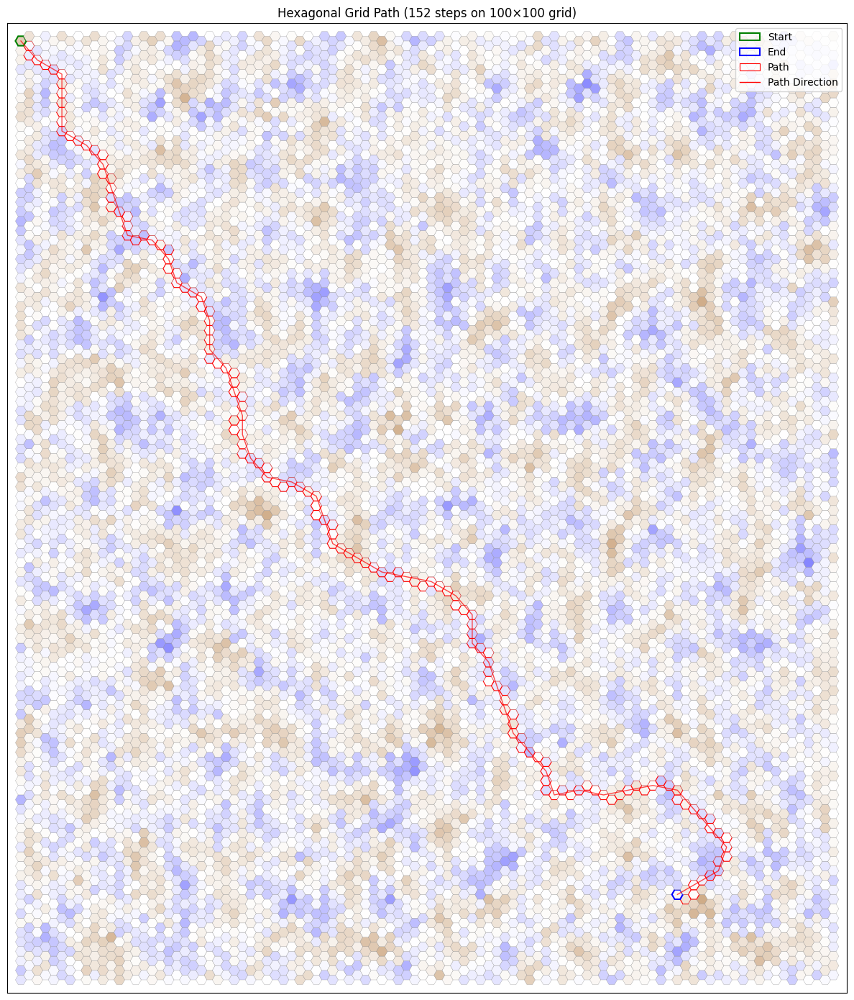

In [12]:
rrt_path,rrt_cost, rrt_comp_time, rrt_nodes_expanded = rrt_search(hex_data, start, goal, max_iterations=20000, side=side_length, goal_threshold=1.5)

print(f"Total Path Cost: {rrt_cost:.3f}")
print(f"Computation Time: {rrt_comp_time:.3f} seconds")
print(f"Nodes Expanded: {rrt_nodes_expanded}")
plot_hex_grid_with_path(hex_data, rrt_path)

Found path: [(0, 0), (1, 1), (1, 2), (2, 3), (2, 4), (3, 4), (4, 4), (5, 5), (5, 6), (6, 6), (7, 7), (8, 7), (9, 7), (9, 8), (10, 9), (10, 10), (11, 10), (12, 11), (13, 11), (13, 12), (14, 13), (14, 14), (15, 15), (15, 16), (16, 17), (17, 17), (17, 18), (18, 19), (19, 19), (19, 20), (20, 20), (21, 20), (22, 20), (23, 21), (23, 22), (24, 23), (24, 24), (25, 25), (25, 26), (26, 27), (26, 28), (27, 28), (28, 29), (29, 29), (30, 29), (30, 30), (31, 31), (32, 31), (32, 32), (33, 32), (34, 32), (35, 32), (36, 33), (37, 33), (37, 34), (38, 35), (38, 36), (39, 37), (39, 38), (40, 38), (41, 38), (42, 39), (42, 40), (43, 40), (44, 41), (44, 42), (45, 43), (46, 43), (46, 44), (47, 44), (48, 44), (49, 44), (50, 45), (50, 46), (51, 46), (52, 47), (52, 48), (53, 48), (54, 49), (54, 50), (55, 50), (56, 50), (57, 51), (58, 51), (58, 52), (59, 53), (59, 54), (60, 54), (61, 54), (62, 54), (63, 55), (63, 56), (64, 56), (65, 57), (65, 58), (66, 59), (67, 59), (67, 60), (68, 61), (69, 61), (70, 61), (71, 6

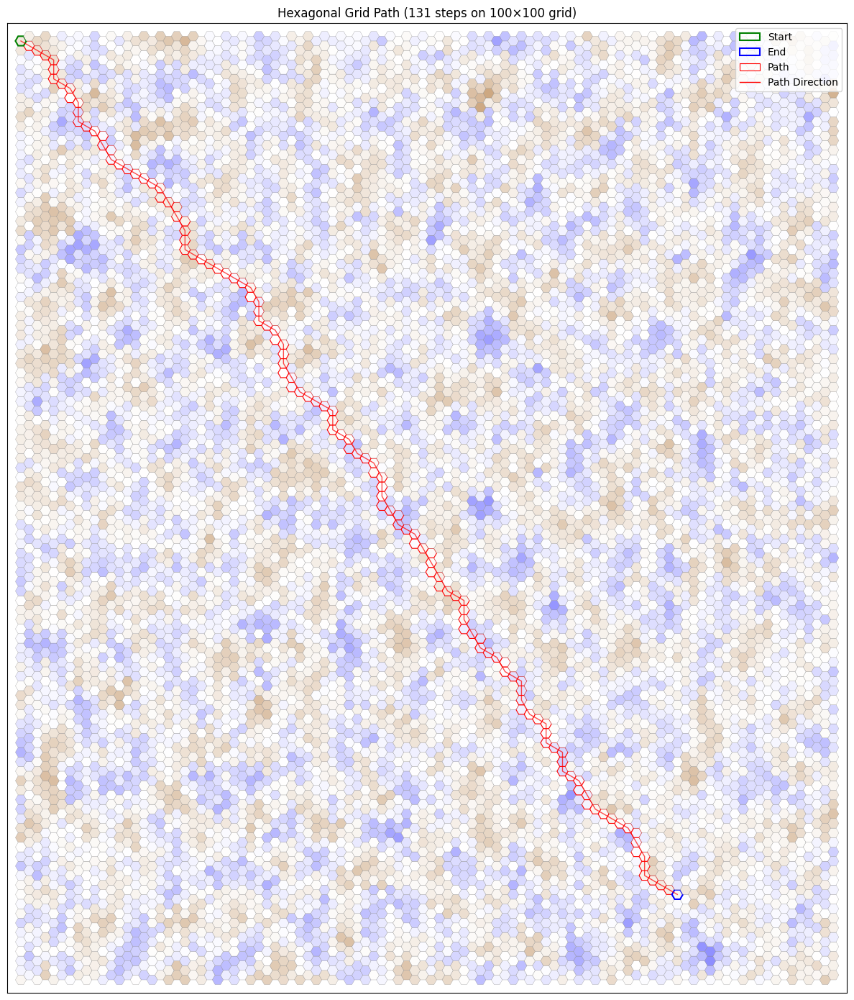

In [15]:
import heapq
import time

def uniform_cost_search(grid, start, goal, uphill_penalty=0.7, downhill_bonus=0.3):
    """
    Perform Uniform Cost Search (UCS) on a hex grid to find the lowest cost path
    from start to goal.

    Parameters:
        grid (numpy array): Terrain grid with elevation values.
        start (tuple): (row, col) coordinates of the starting hex.
        goal (tuple): (row, col) coordinates of the goal hex.
        uphill_penalty (float): Penalty multiplier for moving uphill.
        downhill_bonus (float): Bonus multiplier for moving downhill.

    Returns:
        tuple:
            - path (list): A list of (row, col) tuples representing the path from start to goal.
                           If no path is found, returns an empty list.
            - total_cost (float): The cumulative cost for the found path (or float('inf') if no path is found).
            - computation_time (float): Total computation time in seconds.
            - nodes_expanded (int): The total number of nodes expanded during the search.
    """
    rows, cols = grid.shape
    frontier = []
    heapq.heappush(frontier, (0, start))

    # Dictionaries to track the best path and cost for each cell
    came_from = {start: None}
    cost_so_far = {start: 0}

    # Counter for nodes expanded and time measurement
    nodes_expanded = 0
    start_time = time.time()

    while frontier:
        current_cost, current = heapq.heappop(frontier)
        nodes_expanded += 1  # Counting the current expansion

        # Check if we have reached the goal
        if current == goal:
            break

        # Expand neighbors from the current cell
        for neighbor in get_hex_neighbors(rows, cols, current[0], current[1]):
            move_cost = calculate_movement_cost(grid, current, neighbor,
                                                uphill_penalty, downhill_bonus)
            new_cost = cost_so_far[current] + move_cost

            # If the neighbor has not been explored or a cheaper path is found, update its cost.
            if neighbor not in cost_so_far or new_cost < cost_so_far[neighbor]:
                cost_so_far[neighbor] = new_cost
                heapq.heappush(frontier, (new_cost, neighbor))
                came_from[neighbor] = current

    end_time = time.time()
    computation_time = end_time - start_time

    # Check if a path was found; if not, return an empty list and infinite cost.
    if goal not in came_from:
        print("No path found from {} to {}.".format(start, goal))
        return [], float('inf'), computation_time, nodes_expanded

    # Reconstruct the path from goal to start by backtracking.
    path = []
    current = goal
    while current is not None:
        path.append(current)
        current = came_from[current]
    path.reverse()

    return path, cost_so_far[goal], computation_time, nodes_expanded


ucs_path, ucs_total_cost, ucs_comp_time, ucs_nodes_expanded = uniform_cost_search(hex_data, start, goal)
print("Found path:", ucs_path)
print("Total cost:", ucs_total_cost)
print("Computation time (seconds):", ucs_comp_time)
print("Nodes expanded:", ucs_nodes_expanded)
# Plot the grid with the found path highlighted.
plot_hex_grid_with_path(hex_data, ucs_path, side=side_length, rotate_deg=30)


Running A* Search...
Running Greedy Best-First Search...
Running Uniform Cost Search...
Running RRT Search...

Algorithm Comparison Summary:
--------------------------------------------------------------------------------
Algorithm  | Path Length  | Path Cost    | Time (s)     | Nodes Expanded 
--------------------------------------------------------------------------------
A*         | 129          | 129.845      | 0.003s        | 133            
Greedy     | 129          | 130.010      | 0.002s        | 129            
UCS        | 129          | 128.931      | 0.077s        | 9469           
RRT        | 0            | ∞            | 1.142s        | 1813           


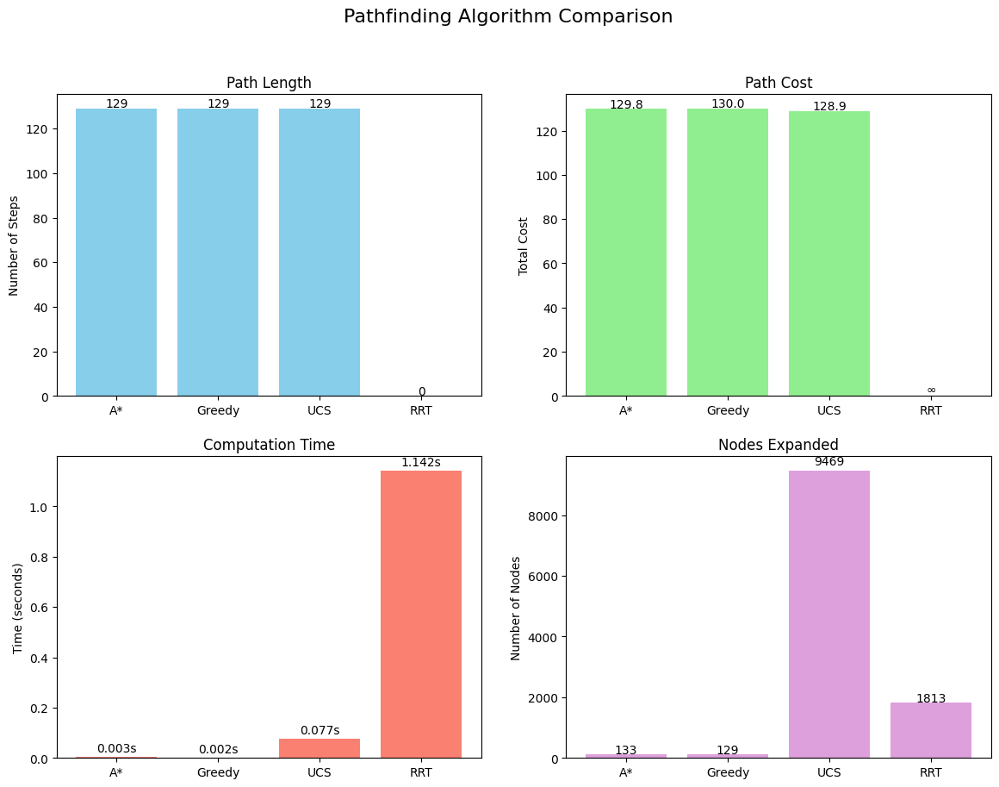

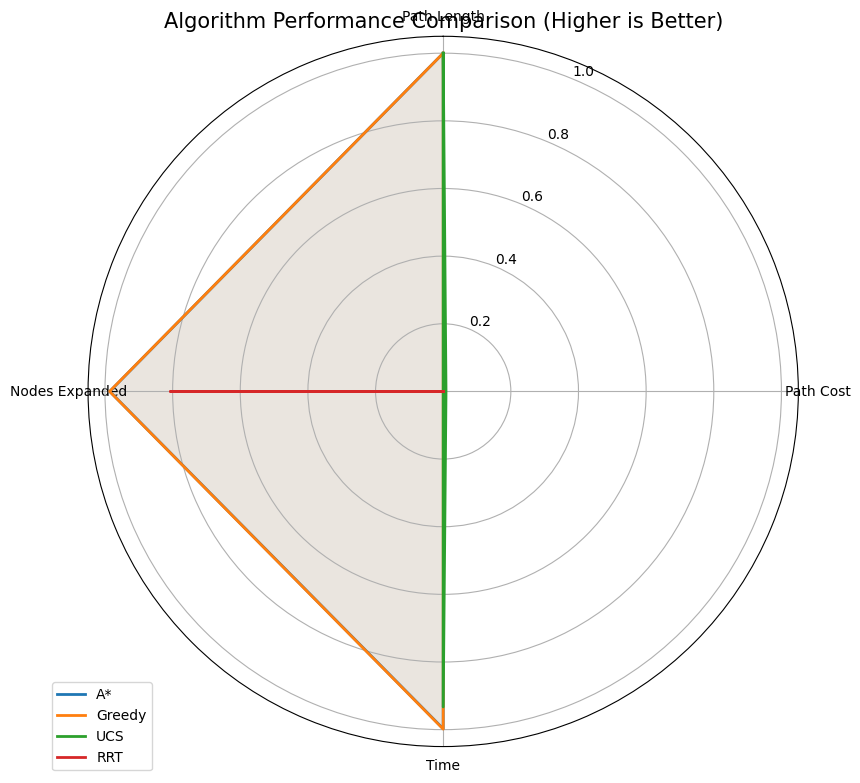


Visualizing A* path...


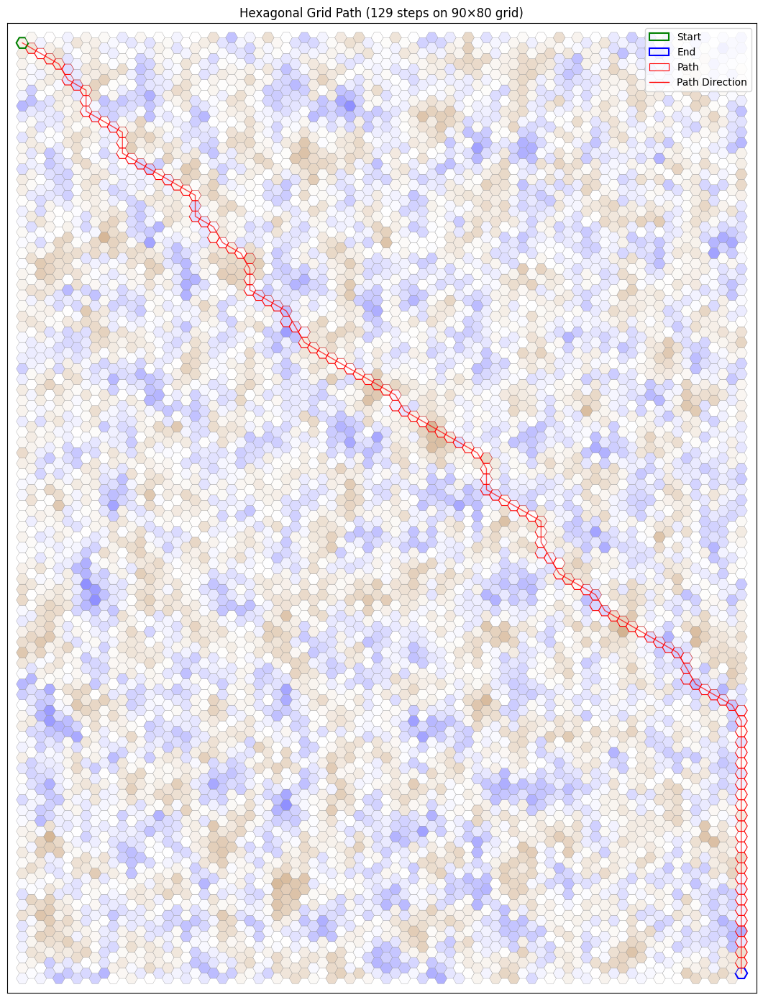


Visualizing Greedy path...


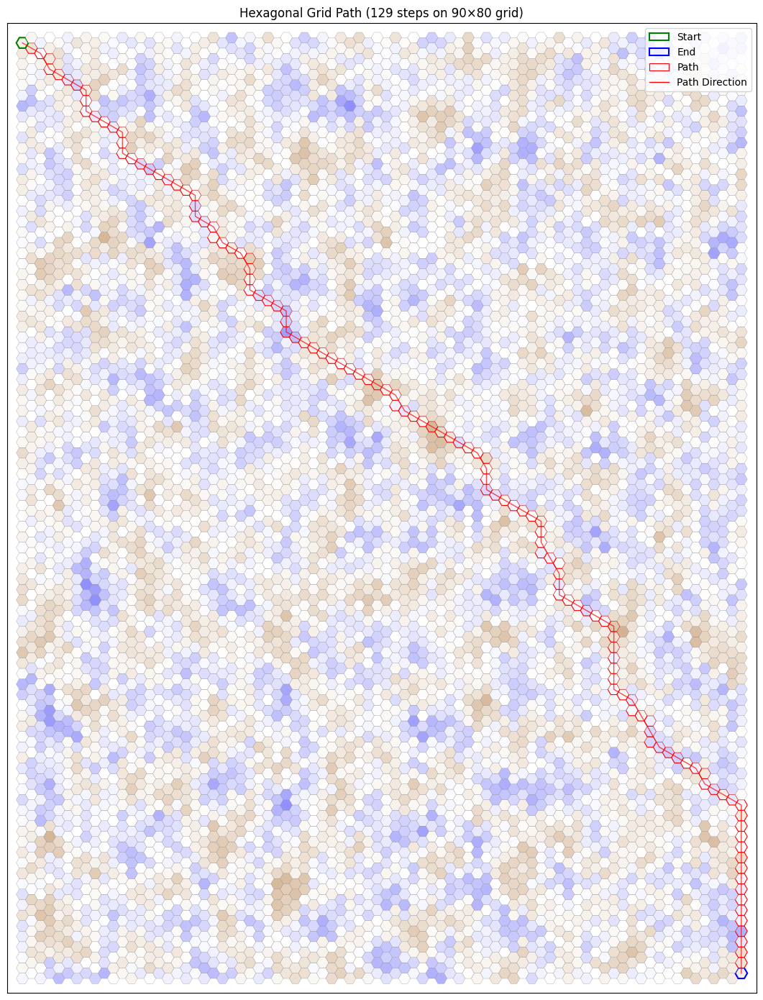


Visualizing UCS path...


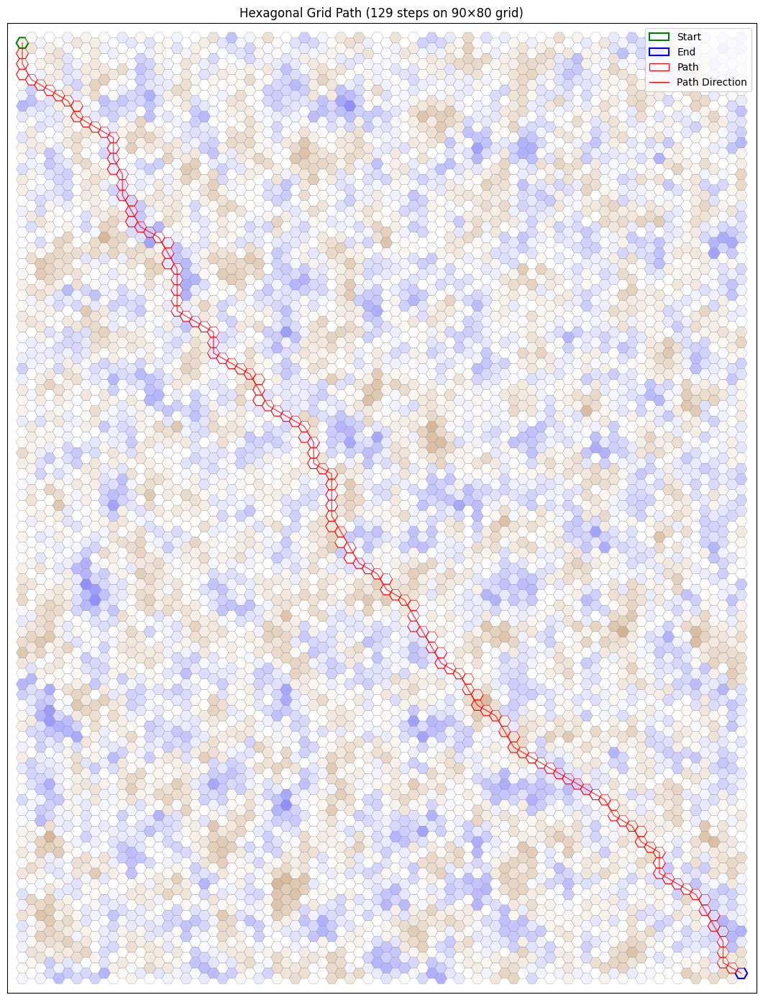

In [18]:
import matplotlib.pyplot as plt
import numpy as np
import time

def compare_algorithms(grid, start, goal, uphill_penalty=0.8, downhill_bonus=0.2,
                      rrt_iterations=2000, side_length=1.0, goal_threshold=1.5):
    """
    Compare different pathfinding algorithms on the same terrain and visualize metrics.

    Parameters:
        grid: Terrain grid with elevation values
        start: (row, col) starting position
        goal: (row, col) destination
        uphill_penalty: Cost multiplier for uphill movement
        downhill_bonus: Cost reduction for downhill movement
        rrt_iterations: Maximum iterations for RRT algorithm
        side_length: Hexagon side length for RRT distance calculations
        goal_threshold: Distance threshold for RRT goal detection
    """
    # Dictionary to store results
    results = {}

    print("Running A* Search...")
    a_star_path, a_star_cost, a_star_time, a_star_nodes = a_star_search(
        grid, start, goal, uphill_penalty, downhill_bonus)
    results['A*'] = {
        'path': a_star_path,
        'cost': a_star_cost,
        'time': a_star_time,
        'nodes': a_star_nodes,
        'path_length': len(a_star_path)
    }

    print("Running Greedy Best-First Search...")
    greedy_path, greedy_cost, greedy_time, greedy_nodes = greedy_best_first_search(
        grid, start, goal, uphill_penalty, downhill_bonus)
    results['Greedy'] = {
        'path': greedy_path,
        'cost': greedy_cost,
        'time': greedy_time,
        'nodes': greedy_nodes,
        'path_length': len(greedy_path)
    }

    print("Running Uniform Cost Search...")
    ucs_path, ucs_cost, ucs_time, ucs_nodes = uniform_cost_search(
        grid, start, goal, uphill_penalty, downhill_bonus)
    results['UCS'] = {
        'path': ucs_path,
        'cost': ucs_cost,
        'time': ucs_time,
        'nodes': ucs_nodes,
        'path_length': len(ucs_path)
    }

    print("Running RRT Search...")
    rrt_path, rrt_cost, rrt_time, rrt_nodes = rrt_search(
        grid, start, goal, rrt_iterations, side_length, goal_threshold,
        uphill_penalty, downhill_bonus)
    results['RRT'] = {
        'path': rrt_path,
        'cost': rrt_cost if rrt_cost is not None else float('inf'),
        'time': rrt_time,
        'nodes': rrt_nodes,
        'path_length': len(rrt_path)
    }

    # Print summary table
    print("\nAlgorithm Comparison Summary:")
    print("-" * 80)
    print(f"{'Algorithm':<10} | {'Path Length':<12} | {'Path Cost':<12} | {'Time (s)':<12} | {'Nodes Expanded':<15}")
    print("-" * 80)

    for algo, data in results.items():
        cost_str = f"{data['cost']:.3f}" if data['cost'] != float('inf') else "∞"
        print(f"{algo:<10} | {data['path_length']:<12} | {cost_str:<12} | {data['time']:.3f}s{' ':<7} | {data['nodes']:<15}")

    # Create visualizations
    create_comparison_charts(results)

    # Visualize paths
    for algo, data in results.items():
        if data['path']:
            print(f"\nVisualizing {algo} path...")
            plot_hex_grid_with_path(grid, data['path'],
                                   side=side_length,
                                   rotate_deg=30)

    return results

def create_comparison_charts(results):
    """
    Create comparative bar charts for algorithm metrics.

    Parameters:
        results: Dictionary containing metrics for each algorithm
    """
    algorithms = list(results.keys())

    # Set up figure with subplots
    fig, axs = plt.subplots(2, 2, figsize=(14, 10))
    fig.suptitle('Pathfinding Algorithm Comparison', fontsize=16)

    # 1. Path Length Comparison
    path_lengths = [results[algo]['path_length'] for algo in algorithms]
    axs[0, 0].bar(algorithms, path_lengths, color='skyblue')
    axs[0, 0].set_title('Path Length')
    axs[0, 0].set_ylabel('Number of Steps')
    for i, v in enumerate(path_lengths):
        axs[0, 0].text(i, v + 0.5, str(v), ha='center')

    # 2. Path Cost Comparison
    costs = [results[algo]['cost'] if results[algo]['cost'] != float('inf') else 0 for algo in algorithms]
    cost_bars = axs[0, 1].bar(algorithms, costs, color='lightgreen')
    axs[0, 1].set_title('Path Cost')
    axs[0, 1].set_ylabel('Total Cost')
    for i, v in enumerate(costs):
        if v == 0 and results[algorithms[i]]['cost'] == float('inf'):
            axs[0, 1].text(i, 1, "∞", ha='center')
        else:
            axs[0, 1].text(i, v + 0.5, f"{v:.1f}", ha='center')

    # 3. Computation Time Comparison
    times = [results[algo]['time'] for algo in algorithms]
    axs[1, 0].bar(algorithms, times, color='salmon')
    axs[1, 0].set_title('Computation Time')
    axs[1, 0].set_ylabel('Time (seconds)')
    for i, v in enumerate(times):
        axs[1, 0].text(i, v + 0.02, f"{v:.3f}s", ha='center')

    # 4. Nodes Expanded Comparison
    nodes = [results[algo]['nodes'] for algo in algorithms]
    axs[1, 1].bar(algorithms, nodes, color='plum')
    axs[1, 1].set_title('Nodes Expanded')
    axs[1, 1].set_ylabel('Number of Nodes')
    for i, v in enumerate(nodes):
        axs[1, 1].text(i, v + v*0.02, str(v), ha='center')

    # Add a radar chart to compare all metrics together
    fig_radar = plt.figure(figsize=(10, 8))
    ax_radar = fig_radar.add_subplot(111, polar=True)

    # Normalize metrics for radar chart
    metrics = ['Path Length', 'Path Cost', 'Time', 'Nodes Expanded']

    # Get max values for normalization (excluding infinite costs)
    max_length = max(results[algo]['path_length'] for algo in algorithms) or 1
    valid_costs = [results[algo]['cost'] for algo in algorithms if results[algo]['cost'] != float('inf')]
    max_cost = max(valid_costs) if valid_costs else 1
    max_time = max(results[algo]['time'] for algo in algorithms) or 1
    max_nodes = max(results[algo]['nodes'] for algo in algorithms) or 1

    # For each algorithm, calculate normalized metrics
    # For cost and time, lower is better, so we invert the normalization
    angles = np.linspace(0, 2*np.pi, len(metrics), endpoint=False).tolist()
    angles += angles[:1]  # Close the loop

    ax_radar.set_theta_offset(np.pi / 2)
    ax_radar.set_theta_direction(-1)
    ax_radar.set_thetagrids(np.degrees(angles[:-1]), metrics)

    for algo in algorithms:
        values = [
            results[algo]['path_length'] / max_length,
            1 - (results[algo]['cost'] / max_cost if results[algo]['cost'] != float('inf') else 1),
            1 - (results[algo]['time'] / max_time),
            1 - (results[algo]['nodes'] / max_nodes)
        ]
        values += values[:1]  # Close the loop
        ax_radar.plot(angles, values, linewidth=2, label=algo)
        ax_radar.fill(angles, values, alpha=0.1)

    ax_radar.set_title('Algorithm Performance Comparison (Higher is Better)', size=15)
    ax_radar.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))

    plt.tight_layout()
    plt.show()

# Example usage:
rows, cols = 90, 80  # Smaller grid for faster testing
hex_data = generate_hex_grid(rows, cols, scale=8.0)
start = (0, 0)
goal = (rows-1, cols-1)

# Run the comparison
results = compare_algorithms(hex_data, start, goal)


Testing grid sizes: 100%|██████████| 5/5 [00:20<00:00,  4.19s/it]


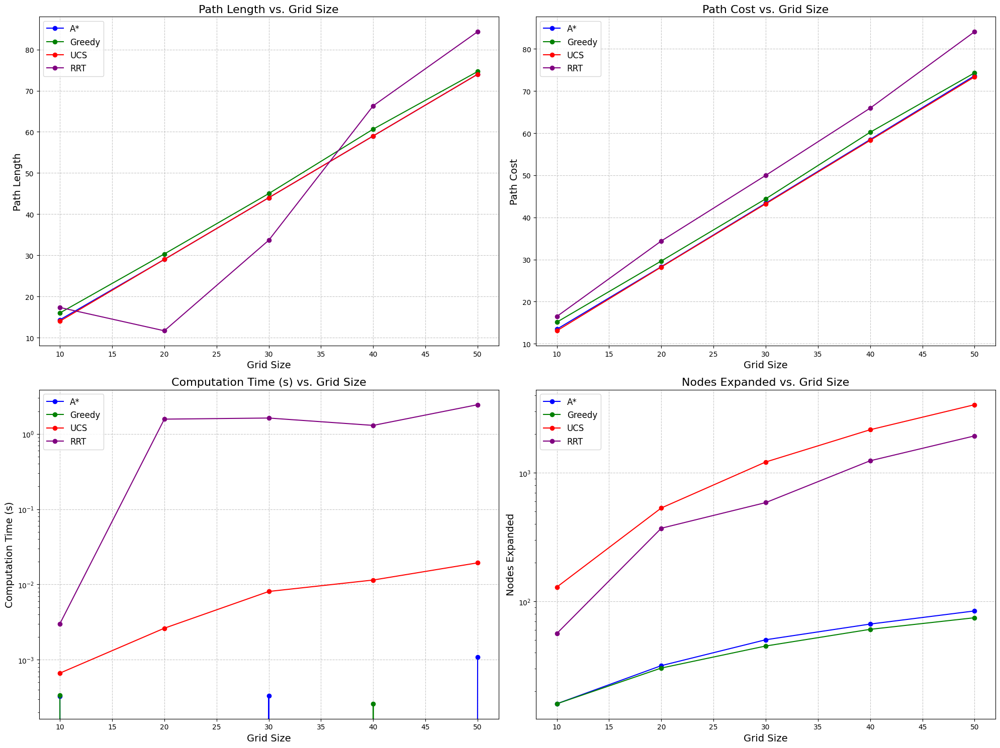

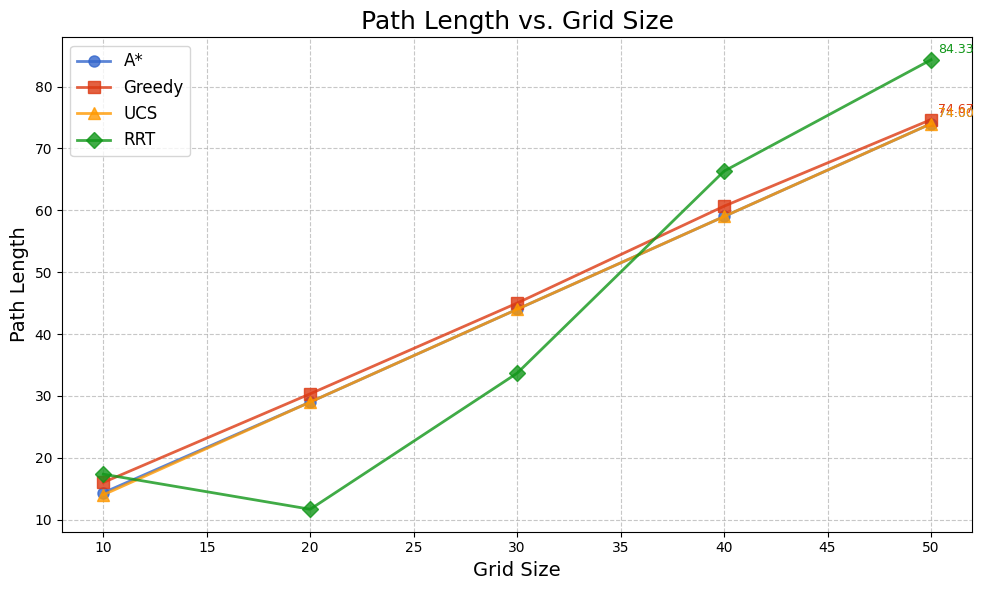

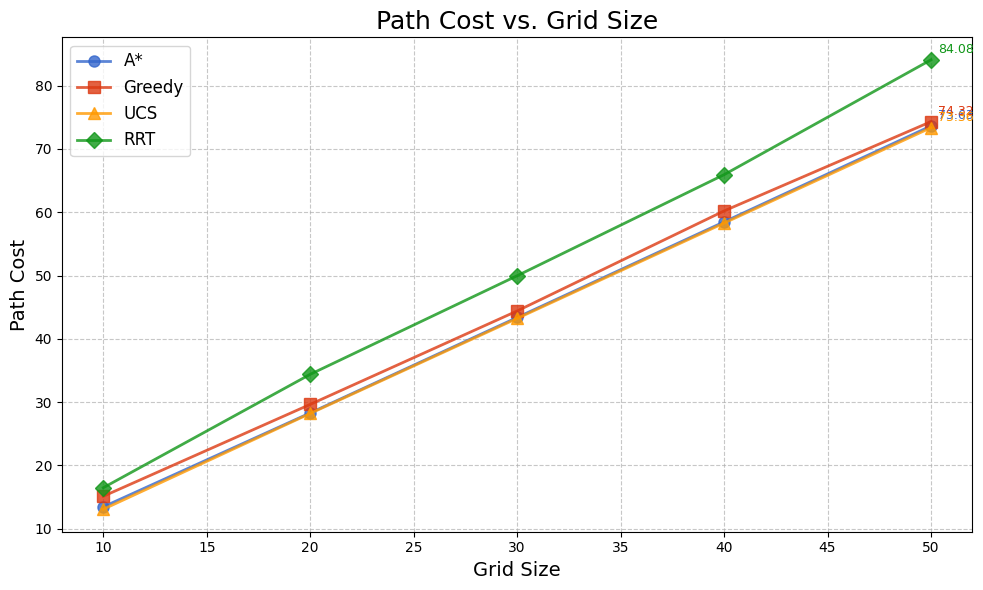

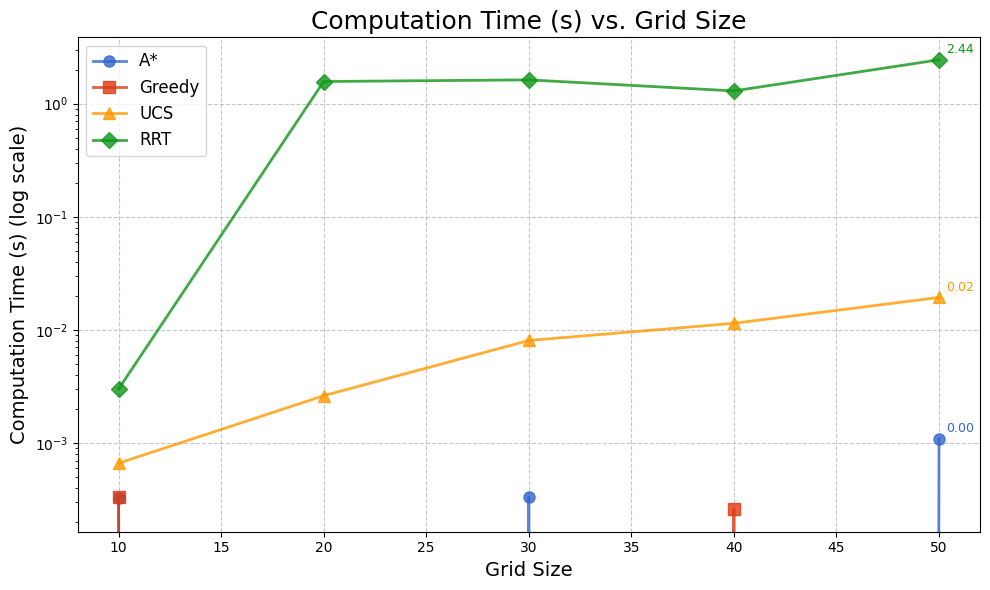

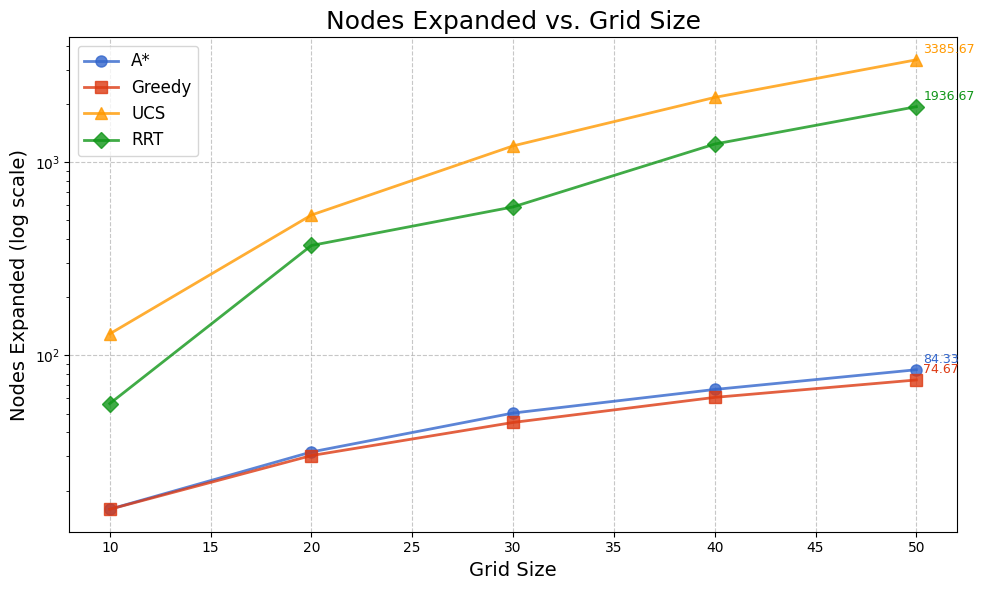

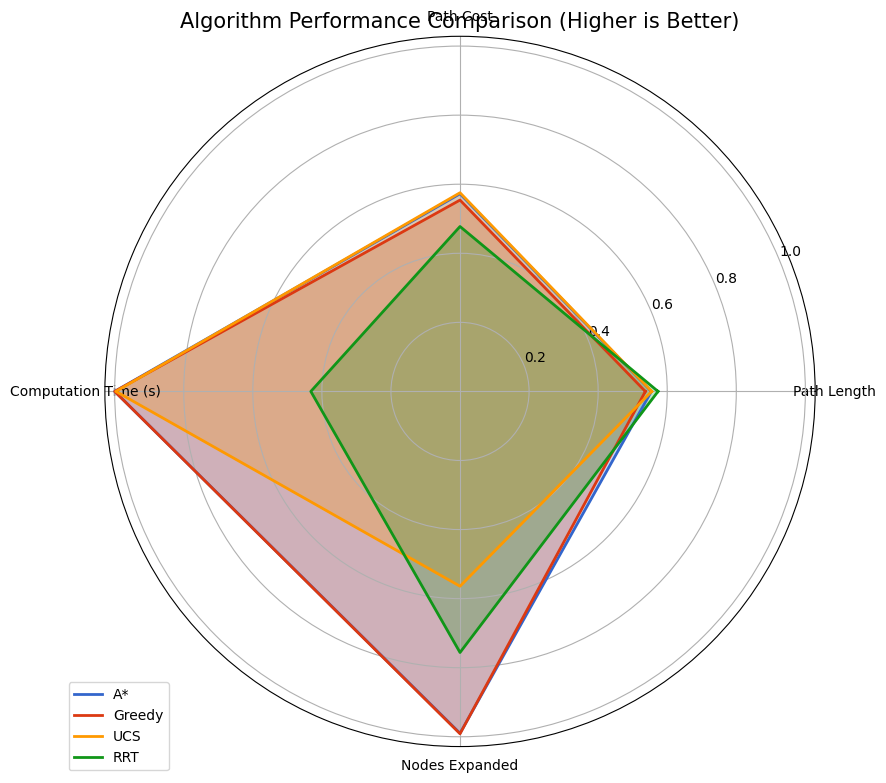

Performance Summary for Grid Size 50x50:
--------------------------------------------------------------------------------
Algorithm  | Path Length  | Path Cost    | Time (s)     | Nodes Expanded 
--------------------------------------------------------------------------------
A*         | 74.0         | 73.63        | 0.0011       | 84.3           
Greedy     | 74.7         | 74.32        | 0.0000       | 74.7           
UCS        | 74.0         | 73.36        | 0.0194       | 3385.7         
RRT        | 84.3         | 84.08        | 2.4412       | 1936.7         

Scaling Analysis (how metrics grow with grid size):
--------------------------------------------------------------------------------

A* Algorithm:
  - Path Length: 5.16x increase (1.03x per unit grid size)
  - Path Cost: 5.47x increase (1.09x per unit grid size)
  - Computation Time: 3.32x increase (0.66x per unit grid size)
  - Nodes Expanded: 5.27x increase (1.05x per unit grid size)

Greedy Algorithm:
  - Path Length: 

Testing grid sizes: 100%|██████████| 6/6 [09:05<00:00, 90.87s/it] 



Testing completed in 545.24 seconds
Performance Summary for Grid Size 210x210:
--------------------------------------------------------------------------------
Algorithm  | Path Length  | Path Cost    | Time (s)     | Nodes Expanded 
--------------------------------------------------------------------------------
A*         | 314.0        | 315.88       | 0.0018       | 342.3          
Greedy     | 320.0        | 321.93       | 0.0035       | 320.0          
UCS        | 314.0        | 314.46       | 0.3376       | 59971.0        
RRT        | 0.0          | ∞            | 28.5934      | 9272.7         

Scaling Analysis (how metrics grow with grid size):
--------------------------------------------------------------------------------

A* Algorithm:
  - Path Length: 21.91x increase (1.04x per unit grid size)
  - Path Cost: 23.47x increase (1.12x per unit grid size)
  - Computation Time: Could not calculate growth (invalid values)
  - Nodes Expanded: 21.40x increase (1.02x per unit gri

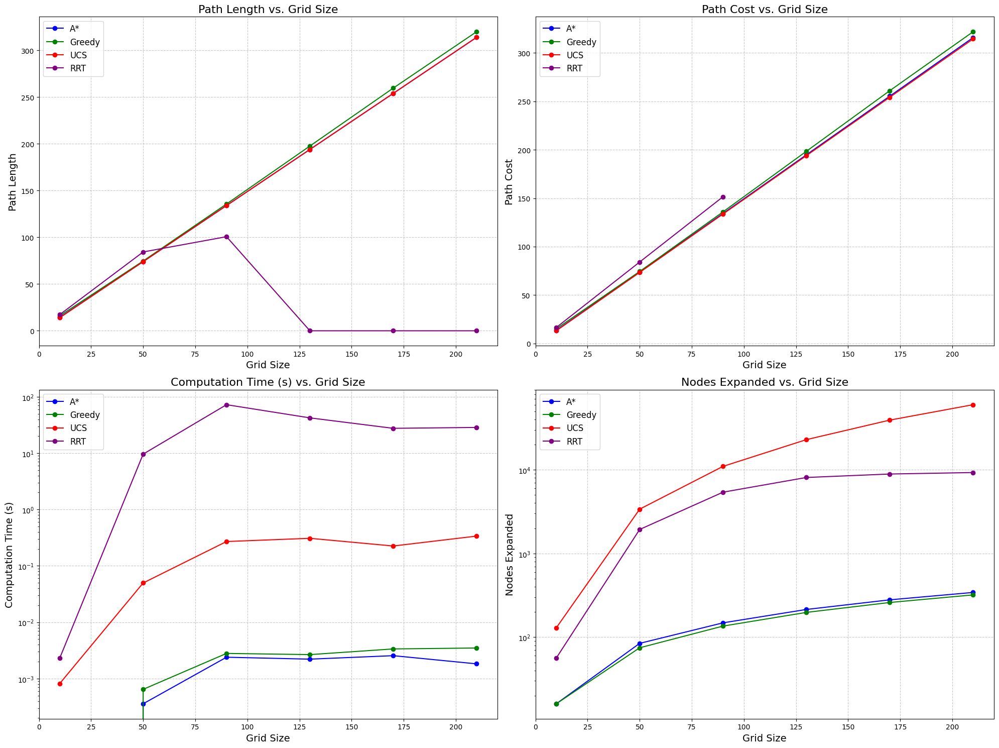

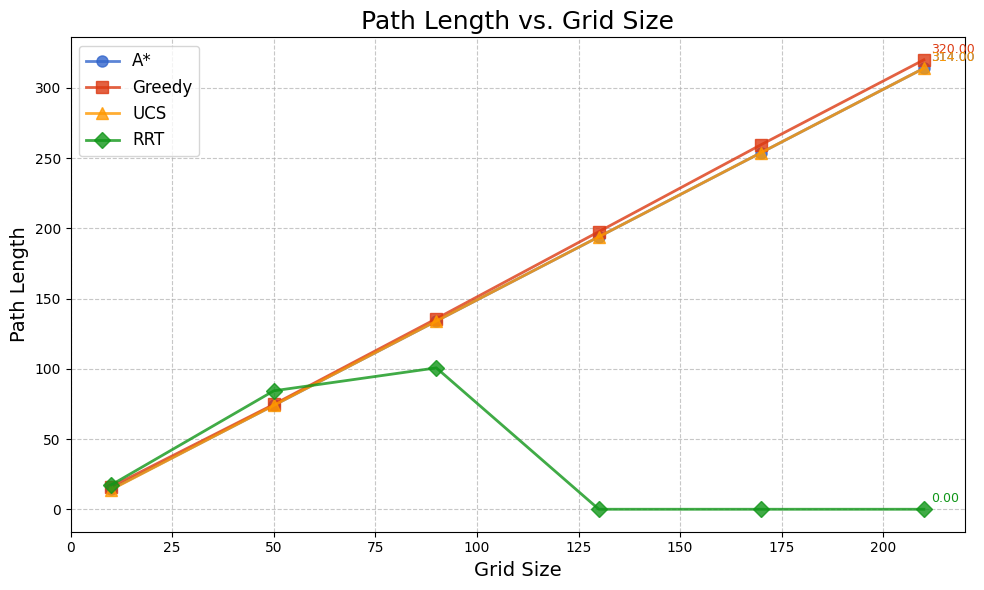

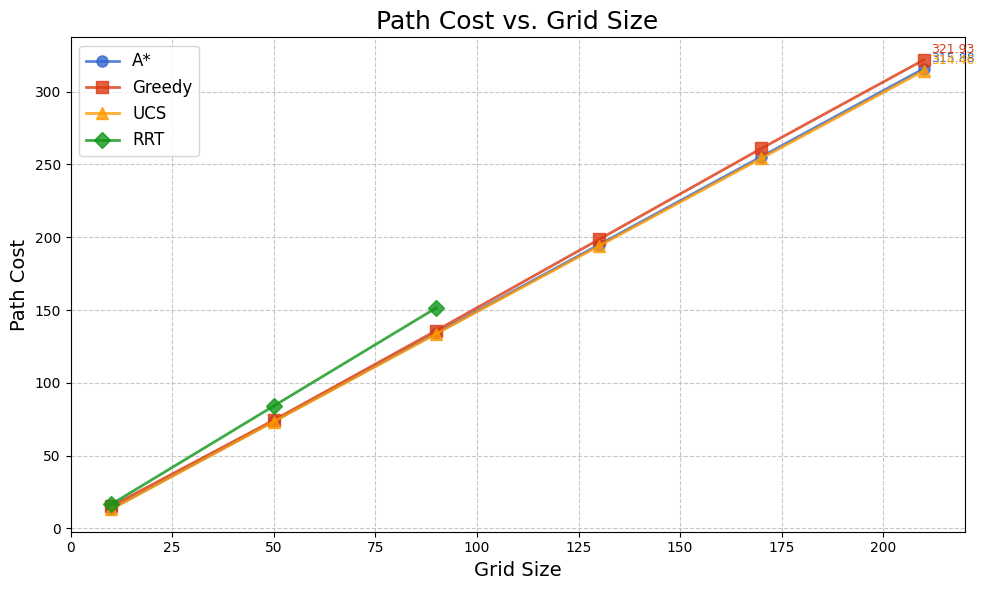

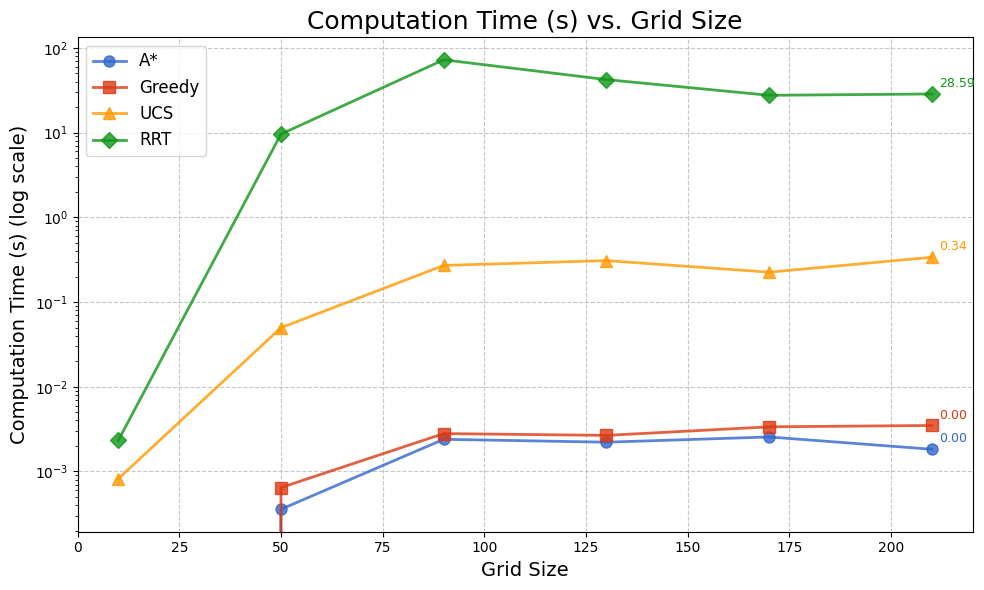

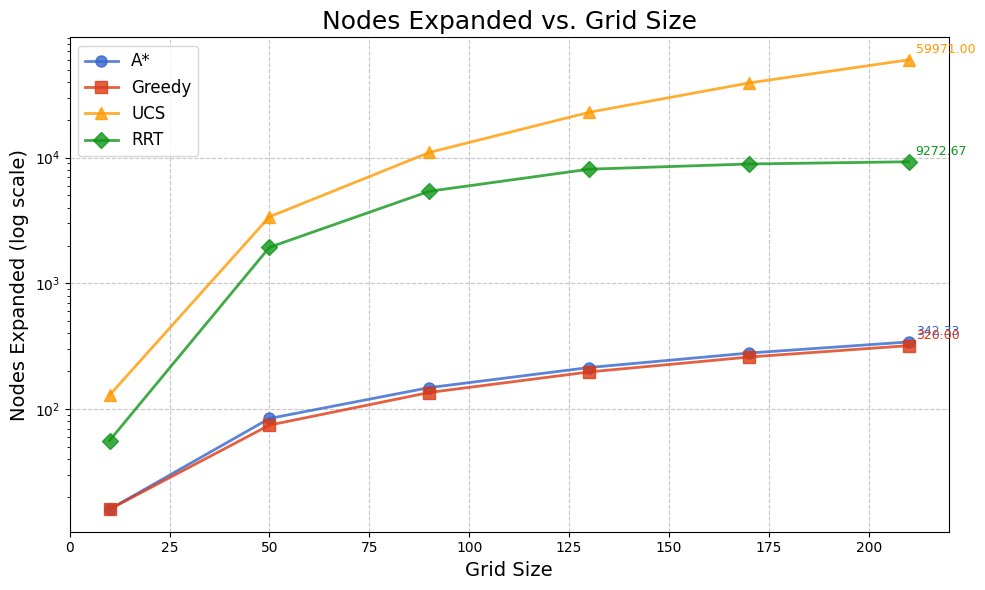

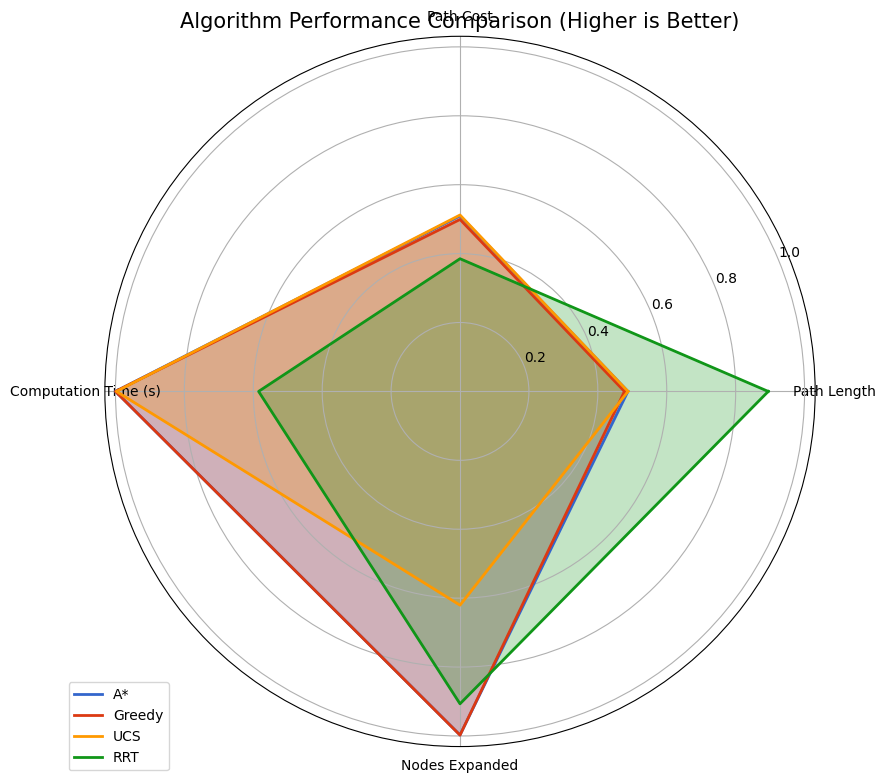


Comparison completed. Results saved as PNG files.


In [19]:
import numpy as np
import matplotlib.pyplot as plt
import time
from tqdm import tqdm

def test_algorithms_with_different_sizes(min_size=10, max_size=50, step=5, num_trials=5, seed=42):
    """
    Test all search algorithms with different map sizes and collect metrics.
    
    Parameters:
        min_size (int): Minimum grid size to test
        max_size (int): Maximum grid size to test
        step (int): Step size between grid sizes
        num_trials (int): Number of trials for each grid size (for averaging)
        seed (int): Random seed for reproducibility
        
    Returns:
        dict: Dictionary containing metrics for each algorithm and grid size
    """
    np.random.seed(seed)
    
    # Initialize results dictionary
    results = {
        "grid_sizes": list(range(min_size, max_size + 1, step)),
        "A*": {"path_length": [], "path_cost": [], "time": [], "nodes_expanded": []},
        "Greedy": {"path_length": [], "path_cost": [], "time": [], "nodes_expanded": []},
        "UCS": {"path_length": [], "path_cost": [], "time": [], "nodes_expanded": []},
        "RRT": {"path_length": [], "path_cost": [], "time": [], "nodes_expanded": []}
    }
    
    # Test each grid size
    for grid_size in tqdm(results["grid_sizes"], desc="Testing grid sizes"):
        # Initialize metrics for current grid size
        size_metrics = {
            "A*": {"path_length": [], "path_cost": [], "time": [], "nodes_expanded": []},
            "Greedy": {"path_length": [], "path_cost": [], "time": [], "nodes_expanded": []},
            "UCS": {"path_length": [], "path_cost": [], "time": [], "nodes_expanded": []},
            "RRT": {"path_length": [], "path_cost": [], "time": [], "nodes_expanded": []}
        }
        
        # Run multiple trials for this grid size
        for trial in range(num_trials):
            # Generate a new hex grid for this trial
            hex_grid = generate_hex_grid(grid_size, grid_size, scale=8.0, seed=seed + trial)
            start = (0, 0)
            goal = (grid_size - 1, grid_size - 1)
            
            # Run A* Search
            a_star_path, a_star_cost, a_star_time, a_star_nodes = a_star_search(
                hex_grid, start, goal, uphill_penalty=0.7, downhill_bonus=0.3)
            
            # Run Greedy Best-First Search
            greedy_path, greedy_cost, greedy_time, greedy_nodes = greedy_best_first_search(
                hex_grid, start, goal, uphill_penalty=0.7, downhill_bonus=0.3)
            
            # Run Uniform Cost Search
            ucs_path, ucs_cost, ucs_time, ucs_nodes = uniform_cost_search(
                hex_grid, start, goal, uphill_penalty=0.7, downhill_bonus=0.3)
            
            # Run RRT Search
            rrt_path, rrt_cost, rrt_time, rrt_nodes = rrt_search(
                hex_grid, start, goal, max_iterations=10000, side=side_length, 
                goal_threshold=1.5, uphill_penalty=0.7, downhill_bonus=0.3)
            
            
            # Store metrics for A*
            size_metrics["A*"]["path_length"].append(len(a_star_path))
            size_metrics["A*"]["path_cost"].append(a_star_cost if a_star_cost is not None else float('inf'))
            size_metrics["A*"]["time"].append(a_star_time)
            size_metrics["A*"]["nodes_expanded"].append(a_star_nodes)
            
            # Store metrics for Greedy
            size_metrics["Greedy"]["path_length"].append(len(greedy_path))
            size_metrics["Greedy"]["path_cost"].append(greedy_cost if greedy_cost is not None else float('inf'))
            size_metrics["Greedy"]["time"].append(greedy_time)
            size_metrics["Greedy"]["nodes_expanded"].append(greedy_nodes)
            
            # Store metrics for UCS
            size_metrics["UCS"]["path_length"].append(len(ucs_path))
            size_metrics["UCS"]["path_cost"].append(ucs_cost if ucs_cost is not None else float('inf'))
            size_metrics["UCS"]["time"].append(ucs_time)
            size_metrics["UCS"]["nodes_expanded"].append(ucs_nodes)
            
            # Store metrics for RRT
            size_metrics["RRT"]["path_length"].append(len(rrt_path))
            size_metrics["RRT"]["path_cost"].append(rrt_cost if rrt_cost is not None else float('inf'))
            size_metrics["RRT"]["time"].append(rrt_time)
            size_metrics["RRT"]["nodes_expanded"].append(rrt_nodes)
        
        # Calculate average metrics for this grid size
        for algo in ["A*", "Greedy", "UCS", "RRT"]:
            for metric in ["path_length", "path_cost", "time", "nodes_expanded"]:
                # Filter out any inf values for path_cost
                if metric == "path_cost":
                    valid_values = [v for v in size_metrics[algo][metric] if v != float('inf')]
                    if valid_values:
                        results[algo][metric].append(np.mean(valid_values))
                    else:
                        results[algo][metric].append(float('inf'))
                else:
                    results[algo][metric].append(np.mean(size_metrics[algo][metric]))
    
    return results

def plot_comparison_metrics(results):
    """
    Plot comparison graphs for all metrics.
    
    Parameters:
        results (dict): Results dictionary from test_algorithms_with_different_sizes
    """
    grid_sizes = results["grid_sizes"]
    metrics = ["path_length", "path_cost", "time", "nodes_expanded"]
    metric_titles = ["Path Length", "Path Cost", "Computation Time (s)", "Nodes Expanded"]
    algorithms = ["A*", "Greedy", "UCS", "RRT"]
    colors = ["blue", "green", "red", "purple"]
    
    plt.figure(figsize=(20, 15))
    
    for i, (metric, title) in enumerate(zip(metrics, metric_titles)):
        plt.subplot(2, 2, i+1)
        
        for algo, color in zip(algorithms, colors):
            # Convert inf values to NaN for plotting
            y_values = [float('nan') if v == float('inf') else v for v in results[algo][metric]]
            plt.plot(grid_sizes, y_values, marker='o', color=color, label=algo)
        
        plt.title(f"{title} vs. Grid Size", fontsize=16)
        plt.xlabel("Grid Size", fontsize=14)
        plt.ylabel(title, fontsize=14)
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.legend(fontsize=12)
        
        # Add log scale for nodes expanded and computation time
        if metric in ["nodes_expanded", "time"]:
            plt.yscale('log')
    
    plt.tight_layout()
    plt.savefig("search_algorithm_comparison.png", dpi=300)
    plt.show()

# Run the tests and plot the results
results = test_algorithms_with_different_sizes(min_size=10, max_size=50, step=10, num_trials=3)
plot_comparison_metrics(results)

def plot_detailed_comparison(results):
    """
    Create more detailed comparison plots with error bars and subplots for each metric.
    
    Parameters:
        results (dict): Results dictionary from test_algorithms_with_different_sizes
    """
    grid_sizes = results["grid_sizes"]
    metrics = ["path_length", "path_cost", "time", "nodes_expanded"]
    metric_titles = ["Path Length", "Path Cost", "Computation Time (s)", "Nodes Expanded"]
    algorithms = ["A*", "Greedy", "UCS", "RRT"]
    colors = ["#3366CC", "#DC3912", "#FF9900", "#109618"]
    markers = ['o', 's', '^', 'D']
    
    # Create a figure for each metric
    for metric_idx, (metric, title) in enumerate(zip(metrics, metric_titles)):
        plt.figure(figsize=(10, 6))
        
        for algo_idx, (algo, color, marker) in enumerate(zip(algorithms, colors, markers)):
            # Convert inf values to NaN for plotting
            y_values = [float('nan') if v == float('inf') else v for v in results[algo][metric]]
            
            plt.plot(grid_sizes, y_values, marker=marker, color=color, label=algo, 
                     linewidth=2, markersize=8, alpha=0.8)
        
        plt.title(f"{title} vs. Grid Size", fontsize=18)
        plt.xlabel("Grid Size", fontsize=14)
        plt.ylabel(title, fontsize=14)
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.legend(fontsize=12, loc='best')
        
        # Add log scale for nodes expanded and computation time
        if metric in ["nodes_expanded", "time"]:
            plt.yscale('log')
            plt.ylabel(f"{title} (log scale)", fontsize=14)
        
        # Add annotations for key points
        for algo_idx, (algo, color) in enumerate(zip(algorithms, colors)):
            y_values = [float('nan') if v == float('inf') else v for v in results[algo][metric]]
            
            # Annotate the largest grid size point
            if not np.isnan(y_values[-1]):
                plt.annotate(f"{y_values[-1]:.2f}", 
                             xy=(grid_sizes[-1], y_values[-1]),
                             xytext=(5, 5), textcoords='offset points',
                             color=color, fontsize=9)
        
        plt.tight_layout()
        plt.savefig(f"search_algorithm_comparison_{metric}.png", dpi=300)
        plt.show()

    # Create a radar chart to compare all algorithms
    plt.figure(figsize=(10, 8))
    ax = plt.subplot(111, polar=True)
    
    # Number of metrics
    N = len(metrics)
    
    # Angles for each metric (in radians)
    angles = np.linspace(0, 2*np.pi, N, endpoint=False).tolist()
    angles += angles[:1]  # Close the loop
    
    # Normalize the metrics for radar chart
    normalized_results = {}
    for algo in algorithms:
        normalized_results[algo] = []
        for metric in metrics:
            values = results[algo][metric]
            if metric in ["path_length", "path_cost"]:
                # For path length and cost, lower is better
                min_val = min([min([v for v in results[a][metric] if v != float('inf')]) for a in algorithms])
                max_val = max([max([v for v in results[a][metric] if v != float('inf')]) for a in algorithms])
                
                # Normalize and invert (so lower values are better)
                norm_values = [1 - ((v - min_val) / (max_val - min_val)) if v != float('inf') else 0 for v in values]
            else:
                # For time and nodes expanded, lower is better
                min_val = min([min(results[a][metric]) for a in algorithms])
                max_val = max([max(results[a][metric]) for a in algorithms])
                
                # Normalize and invert (so lower values are better)
                norm_values = [1 - ((v - min_val) / (max_val - min_val)) for v in values]
            
            # Average the normalized values
            normalized_results[algo].append(np.mean(norm_values))
    
    # Plot each algorithm
    for algo_idx, (algo, color) in enumerate(zip(algorithms, colors)):
        values = normalized_results[algo]
        values += values[:1]  # Close the loop
        
        ax.plot(angles, values, color=color, linewidth=2, label=algo)
        ax.fill(angles, values, color=color, alpha=0.25)
    
    # Set the labels
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(metric_titles)
    
    # Add legend
    plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
    plt.title("Algorithm Performance Comparison (Higher is Better)", size=15)
    
    plt.tight_layout()
    plt.savefig("search_algorithm_radar_comparison.png", dpi=300)
    plt.show()

# Run the detailed plots
plot_detailed_comparison(results)



def analyze_algorithm_performance(results):
    """
    Perform statistical analysis on the algorithm performance results.
    
    Parameters:
        results (dict): Results dictionary from test_algorithms_with_different_sizes
    """
    grid_sizes = results["grid_sizes"]
    metrics = ["path_length", "path_cost", "time", "nodes_expanded"]
    metric_titles = ["Path Length", "Path Cost", "Computation Time", "Nodes Expanded"]
    algorithms = ["A*", "Greedy", "UCS", "RRT"]
    
    # Print summary statistics for the largest grid size
    largest_size_idx = -1
    largest_size = grid_sizes[largest_size_idx]
    
    print(f"Performance Summary for Grid Size {largest_size}x{largest_size}:")
    print("-" * 80)
    print(f"{'Algorithm':<10} | {'Path Length':<12} | {'Path Cost':<12} | {'Time (s)':<12} | {'Nodes Expanded':<15}")
    print("-" * 80)
    
    for algo in algorithms:
        path_length = results[algo]["path_length"][largest_size_idx]
        path_cost = results[algo]["path_cost"][largest_size_idx]
        time_taken = results[algo]["time"][largest_size_idx]
        nodes_expanded = results[algo]["nodes_expanded"][largest_size_idx]
        
        path_cost_str = f"{path_cost:.2f}" if path_cost != float('inf') else "∞"
        
        print(f"{algo:<10} | {path_length:<12.1f} | {path_cost_str:<12} | {time_taken:<12.4f} | {nodes_expanded:<15.1f}")
    
    print("\nScaling Analysis (how metrics grow with grid size):")
    print("-" * 80)
    
    for algo in algorithms:
        print(f"\n{algo} Algorithm:")
        for metric, title in zip(metrics, metric_titles):
            # Calculate growth rate (ratio of largest to smallest grid size)
            smallest_val = results[algo][metric][0]
            largest_val = results[algo][metric][-1]
            
            if smallest_val > 0 and largest_val != float('inf'):
                growth_ratio = largest_val / smallest_val
                growth_factor = growth_ratio / (grid_sizes[-1] / grid_sizes[0])
                
                print(f"  - {title}: {growth_ratio:.2f}x increase ({growth_factor:.2f}x per unit grid size)")
            else:
                print(f"  - {title}: Could not calculate growth (invalid values)")

# Run the analysis
analyze_algorithm_performance(results)

def run_comprehensive_algorithm_comparison(min_size=10, max_size=510, step=50, num_trials=3, seed=42):
    """
    Run a comprehensive comparison of all search algorithms with different map sizes.
    
    Parameters:
        min_size (int): Minimum grid size to test
        max_size (int): Maximum grid size to test
        step (int): Step size between grid sizes
        num_trials (int): Number of trials for each grid size (for averaging)
        seed (int): Random seed for reproducibility
    """
    print("Starting comprehensive algorithm comparison...")
    print(f"Testing grid sizes from {min_size}x{min_size} to {max_size}x{max_size} with step {step}")
    print(f"Running {num_trials} trials for each grid size")
    
    # Run the tests
    start_time = time.time()
    results = test_algorithms_with_different_sizes(
        min_size=min_size, max_size=max_size, step=step, num_trials=num_trials, seed=seed
    )
    total_time = time.time() - start_time
    
    print(f"\nTesting completed in {total_time:.2f} seconds")
    
    # Analyze the results
    analyze_algorithm_performance(results)
    
    # Plot the results
    print("\nGenerating comparison plots...")
    plot_comparison_metrics(results)
    plot_detailed_comparison(results)
    
    print("\nComparison completed. Results saved as PNG files.")
    
    return results

# Run the comprehensive comparison
comparison_results = run_comprehensive_algorithm_comparison(
    min_size=10, max_size=210, step=40, num_trials=3
)
